# Foreword
This is V2 of this sheet. The first one I froze a save of as I believe it had some problems with the methodology of my data pre-processing.
**BUT**, not to worry. This is V2, which is based on the same bones. So this should ideally fix some of the issues and get a better model.

# 0. Census Data Experiment
## Machine Learning and Data Science Practice
### By Rory Thomas
So this is basically me playing with this one question: What can you can guess from this data?

You can get the data from here: https://www.ons.gov.uk/census/maps/choropleth/, or in bulk (and a better format here) https://www.nomisweb.co.uk/sources/census_2021_bulk.

The Election data is available here:
- 2024: https://commonslibrary.parliament.uk/research-briefings/cbp-10009/.
- 2019: https://commonslibrary.parliament.uk/research-briefings/cbp-8749/.

Obviously, doesn't narrow down what I am actually talking about so let's be more specific about some of the questions:
- Could you estimate the number of LGBT people in an area?
- Could you estimate if the area provided is wealthy or not?
- Could you guess the average age of designated area?
- Could you guess the education level of an area?
- Could you identify areas that are likely to have a university?
- Could you guess how an area voted in the 2024 general election?

**"Could you guess how an area voted in the 2024 general election?"** is the most interesting question to be honest. Let's work with this.

# 1. Install the required packages and read in the data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, KBinsDiscretizer, QuantileTransformer, LabelEncoder
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, VotingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.inspection import permutation_importance
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score, mean_squared_error, mean_absolute_error, r2_score
from imblearn.over_sampling import SMOTE
import xgboost as xgb
import torch
import os
from scipy.stats import f_oneway
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from statsmodels.multivariate.manova import MANOVA


In [2]:
current_dir = os.getcwd()
census_data_dir = (current_dir + '/DataSet/Census Data/')
election_data_dir = (current_dir + '/DataSet/Election Data/')
mapping_data_dir = (current_dir + '/DataSet/Mapping/')

In [3]:
# This is the random state variable that will be used throughout the code.
random_code = 42

Before I go any further, it is worth exploring what each dataset suffix refers to.
1. 'CTRY' refers to "Country". These are always "England and Wales", "England" and "Wales. This basically the highest level you can get (NI and Scotland handle their own censuses).
2. 'LSOA' refers to [unknown acronym]. These are basically fractions of districts, like a fraction of Roath, or Pontcanna.
3. 'LTLA' refers to [unknown acronym]. These are basically whole cities; think Newport, Cardiff, Swansea.
4. 'MSOA' refers to "Middle Layer Super Output Areas". These are districts of an area; think Cathays North, Cathays South, Roath and Pontcanna. 
5. 'OA' refers to "Output Areas". This is the most granular layer, containing sets of streets like "Coburn Street and Wyverne Street", and "Thesiger Street".
6. 'RGN' refers to "Regions". These are more arbitrary categories like South East, South West, London and North West.
7. 'UTLA' refers to "Local Area Districts (LAD)". This is basically Cardiff, Newport, Rhondda Cynon Taf, Bridgend, greater areas of a central place. 
8. 'PCON' refers to "Parliamentary Constituencies". This exactly what it sounds like.

Regarding the election data though, we have 1 problem. The census doesn't record these within electoral bounds. None of the above listed are anything to do with electoral stuff.
So we have a task to map one of these to the electoral map, somehow. We have some solutions:
1. We have the 2024 Westminster Electoral Constituencies to OA: https://geoportal.statistics.gov.uk/datasets/5968b5b2c0f14dd29ba277beaae6dec3_0/explore
2. We also have the 2024 PCON to MSOA: https://geoportal.statistics.gov.uk/datasets/098360c460dd41beacbdfad83bc4fea2_0/explore
3. We also have the 2024 PCON to LSOA: https://geoportal.statistics.gov.uk/datasets/0d62b50d90d14b8d8b2ccf9f770b5751_0/explore (which is near-enough the same granularity of OA, so I'm not sure what benefit it would add)
The clear solution is to build a mapping table.

One more thing. All the data headers are the first row for each CSV, so I'll need to extract the definitions from there and get whatever is usable.
*I did download all the data, which may not be useful for me to work. So I may have given myself a task to clean up a lot of it.*

In [4]:
df = pd.read_csv(os.path.join(census_data_dir, 'census2021-ts002-rgn.csv'))
df.head()

,date,geography,geography code,Marital and civil partnership status: Total; measures: Value,Marital and civil partnership status: Never married and never registered a civil partnership; measures: Value,Marital and civil partnership status: Married or in a registered civil partnership; measures: Value,Marital and civil partnership status: Married or in a registered civil partnership: Married; measures: Value,Marital and civil partnership status: Married or in a registered civil partnership: Married: Opposite sex; measures: Value,Marital and civil partnership status: Married or in a registered civil partnership: Married: Same sex; measures: Value,Marital and civil partnership status: Married or in a registered civil partnership: In a registered civil partnership; measures: Value,...,Marital and civil partnership status: Married or in a registered civil partnership: In a registered civil partnership: Same sex; measures: Value,"Marital and civil partnership status: Separated, but still legally married or still legally in a civil partnership; measures: Value","Marital and civil partnership status: Separated, but still legally married or still legally in a civil partnership: Separated, but still married; measures: Value","Marital and civil partnership status: Separated, but still legally married or still legally in a civil partnership: Separated, but still in a registered civil partnership; measures: Value",Marital and civil partnership status: Divorced or civil partnership dissolved; measures: Value,Marital and civil partnership status: Divorced or civil partnership dissolved: Divorced; measures: Value,Marital and civil partnership status: Divorced or civil partnership dissolved: Formerly in a civil partnership now legally dissolved; measures: Value,Marital and civil partnership status: Widowed or surviving civil partnership partner; measures: Value,Marital and civil partnership status: Widowed or surviving civil partnership partner: Widowed; measures: Value,Marital and civil partnership status: Widowed or surviving civil partnership partner: Surviving partner from civil partnership; measures: Value
0,2021,North East,E12000001,2178960,829791,937083,933521,928213,5308,3562,...,2250,54358,54029,329,206974,206505,469,150754,150610,144
1,2021,North West,E12000002,6025636,2372877,2575107,2565016,2548818,16198,10091,...,6683,136428,135494,934,550417,549121,1296,390807,390312,495
2,2021,Yorkshire and The Humber,E12000003,4460298,1679861,1971162,1962879,1951385,11494,8283,...,5308,102350,101660,690,420235,419338,897,286690,286369,321
3,2021,East Midlands,E12000004,3998045,1442049,1832929,1825699,1815824,9875,7230,...,4526,88980,88398,582,378618,377750,868,255469,255208,261
4,2021,West Midlands,E12000005,4801329,1781208,2172973,2164831,2153949,10882,8142,...,4838,110711,110090,621,424612,423752,860,311825,311517,308


## 1.1 Election Data
The election data, I'll keep as two separate tables for two separate elections. Makes it a bit easier for me when doing the analysis.

In [5]:
GE2019_df = pd.read_csv(os.path.join(election_data_dir, 'HOC-GE2019-results-by-constituency.csv'))
GE2019_df.dropna(axis=1,inplace=True)
GE2019_df.drop(columns=['ONS region ID','Region name','Country name','Constituency type','Member first name','Member surname','Member gender',"Result","Second party", "Majority","APNI", "UUP", "SDLP", "SF", "DUP", "SNP","Of which other winner"], inplace=True)
GE2019_df.rename(columns={'ONS ID':'PCON25CD','Constituency name':'PCON25NM','First party':'Elected','All other candidates':'Ind'}, inplace=True)

GE2024_df = pd.read_csv(os.path.join(election_data_dir, 'HOC-GE2024-results-by-constituency.csv'))
GE2024_df.dropna(axis=1,inplace=True)
GE2024_df.drop(columns=['ONS region ID','Region name','Country name','Constituency type','Member first name','Member surname','Member gender',"Result","Second party", "Majority","APNI", "UUP", "SDLP", "SF", "DUP", "SNP","Of which other winner"], inplace=True)
GE2024_df.rename(columns={'ONS ID':'PCON25CD','Constituency name':'PCON25NM', 'First party':'Elected','All other candidates':'Ind'}, inplace=True)
GE2024_df.head()

,PCON25CD,PCON25NM,Elected,Electorate,Valid votes,Invalid votes,Con,Lab,LD,RUK,Green,PC,Ind
0,W07000081,Aberafan Maesteg,Lab,72580,35755,79,2903,17838,916,7484,1094,4719,801
1,S14000060,Aberdeen North,SNP,75925,42095,115,5881,12773,2583,3781,1275,0,1269
2,S14000061,Aberdeen South,SNP,77328,46345,178,11300,11455,2921,3199,1609,0,648
3,S14000062,Aberdeenshire North and Moray East,SNP,70058,38188,170,12513,3876,2782,5562,0,0,0
4,S14000063,Airdrie and Shotts,Lab,70199,36666,95,1696,18871,725,2971,0,0,1079


Now I do think it's worth keeping the raw numbers but I want these in a bit better format of percentage of the votes. So I'm going to create two new data frames to change the numbers to percents.

In [6]:
GE2019_frac_df = GE2019_df.copy()
GE2019_frac_df.drop(columns=['Electorate','Valid votes', 'Invalid votes'], inplace=True)
GE2019_frac_df[GE2019_frac_df.columns[3:]] = GE2019_df[GE2019_df.columns[6:]].div(GE2019_df[GE2019_df.columns[6:]].sum(axis=1), axis=0)

GE2024_frac_df = GE2024_df.copy()
GE2024_frac_df.drop(columns=['Electorate','Valid votes', 'Invalid votes'], inplace=True)
GE2024_frac_df[GE2024_frac_df.columns[3:]] = GE2024_df[GE2024_df.columns[6:]].div(GE2024_df[GE2024_df.columns[6:]].sum(axis=1), axis=0)

GE2024_frac_df.head()

,PCON25CD,PCON25NM,Elected,Con,Lab,LD,RUK,Green,PC,Ind
0,W07000081,Aberafan Maesteg,Lab,0.081191,0.498895,0.025619,0.209313,0.030597,0.131982,0.022402
1,S14000060,Aberdeen North,SNP,0.213373,0.463428,0.093716,0.137182,0.046259,0.000000,0.046042
2,S14000061,Aberdeen South,SNP,0.362971,0.367949,0.093826,0.102756,0.051683,0.000000,0.020815
3,S14000062,Aberdeenshire North and Moray East,SNP,0.505923,0.156714,0.112481,0.224882,0.000000,0.000000,0.000000
4,S14000063,Airdrie and Shotts,Lab,0.066924,0.744653,0.028609,0.117236,0.000000,0.000000,0.042578


Let's just test my null hypothesis.

[13, 16, 18, 18, 13, 15, 22]
Correct Percentage:  11.304347826086957 %


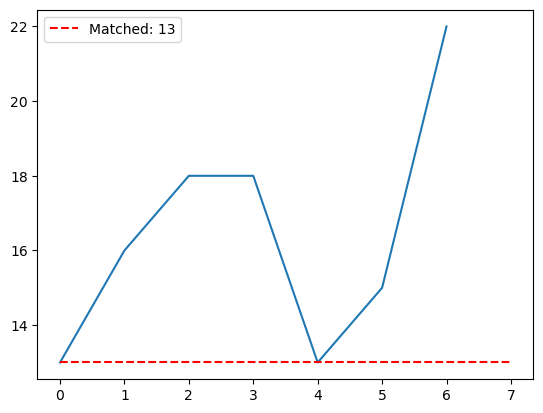

In [7]:
labels = ["Lab", "Con", "LD", "PC", "RUK", "Ind", "Green"]
n_samples = 115

sample = GE2024_frac_df.copy()
sample = sample[sample["PCON25CD"].str.contains("S") == False]
sample = sample[sample["PCON25CD"].str.contains("N") == False]

rand_list = []

label_count = [0] * len(labels)
correct_count = 0
for n in range(n_samples):
    rand_val = np.random.randint(0,7)
    rand_list.append(rand_val)
    label_count[rand_val] += 1
    if labels[rand_val] == GE2024_frac_df['Elected'].iloc[n]:
        correct_count +=1

print(label_count)
sns.lineplot(label_count)
plt.hlines(correct_count,0,len(labels), 'r', linestyles='--', label = "Matched: %d" %correct_count)
plt.legend()
print("Correct Percentage: ", 100 * correct_count/sum(label_count), "%")


Okay, so this gets us approximately 10 - 20%. Not ideal but I don't think this is valid.

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[0.6695652173913044, 0.14782608695652175, 0.034782608695652174, 0.008695652173913044, 0.017391304347826087, 0.017391304347826087, 0.017391304347826087]


<Axes: >

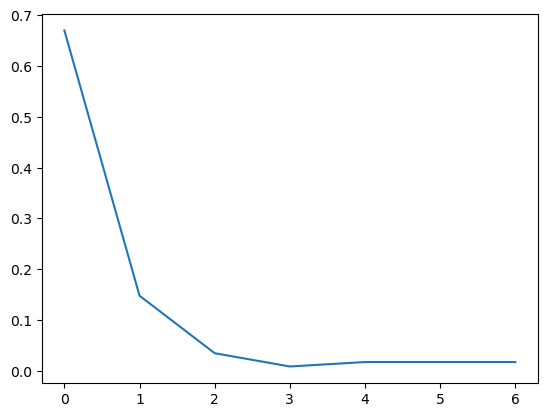

In [8]:
labels = ["Lab", "Con", "LD", "PC", "RUK", "Ind", "Green"]
n_samples = 115

sample = GE2024_frac_df.copy()
sample = sample[sample["PCON25CD"].str.contains("S") == False]
sample = sample[sample["PCON25CD"].str.contains("N") == False]

fixed_list = []

label_count = [0] * len(labels)
correct_count = [0] * len(labels)
for n in range(n_samples):
    for l in labels:
        fixed_val = labels.index(l)
        if l == "Lab":
            fixed_list.append(fixed_val)
        label_count[fixed_val] += 1
        if labels[fixed_val] == GE2024_frac_df['Elected'].iloc[n]:
            correct_count[fixed_val] +=1
            
norm_label_count = [float(i)/max(label_count) for i in label_count]
norm_correct_count = [float(i)/max(label_count) for i in correct_count]

print(norm_label_count)
print(norm_correct_count)
sns.lineplot(norm_correct_count)

Perfect, if we look at this, we can see this a radial slice, or the abs() of a normal distribution. Where our mean is centred on 0 (or our Labour). We can use 65% as our probability.

## 1.2 Mapping Data
Finally, let's get the mapping data and make one unified mapping data frame.
We'll preserve the names too because we can use this for our human readableness.

In [9]:
MSOA2021_to_PCON2024_df = pd.read_csv(os.path.join(mapping_data_dir, 'MSOA_(2021)_to_future_Parliamentary_Constituencies_Lookup_in_England_and_Wales.csv'))
OA2021_to_PCON2024_df = pd.read_csv(os.path.join(mapping_data_dir, 'Output_area_(2021)_to_future_Parliamentary_Constituencies_Lookup_in_England_and_Wales.csv'))
MSOA2021_to_PCON2024_df.dropna(axis=1, inplace=True)
OA2021_to_PCON2024_df.dropna(axis=1, inplace=True)

C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\385570988.py:2: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  OA2021_to_PCON2024_df = pd.read_csv(os.path.join(mapping_data_dir, 'Output_area_(2021)_to_future_Parliamentary_Constituencies_Lookup_in_England_and_Wales.csv'))


In [10]:
MSOA2021_to_PCON2024_df.head()

,MSOA21CD,MSOA21NM,PCON25CD,PCON25NM,LAD21CD,LAD21NM,ObjectId
0,E02004807,Rushmoor 006,E14001063,Aldershot,E07000092,Rushmoor,1
1,E02004804,Rushmoor 003,E14001063,Aldershot,E07000092,Rushmoor,2
2,E02004813,Rushmoor 012,E14001063,Aldershot,E07000092,Rushmoor,3
3,E02004812,Rushmoor 011,E14001063,Aldershot,E07000092,Rushmoor,4
4,E02004805,Rushmoor 004,E14001063,Aldershot,E07000092,Rushmoor,5


In [11]:
OA2021_to_PCON2024_df.head()

,OA21CD,PCON25CD,PCON25NM,LAD21CD,LAD21NM,ObjectId
0,E00000337,E14001073,Barking,E09000002,Barking and Dagenham,1
1,E00000338,E14001073,Barking,E09000002,Barking and Dagenham,2
2,E00000340,E14001073,Barking,E09000002,Barking and Dagenham,3
3,E00000341,E14001073,Barking,E09000002,Barking and Dagenham,4
4,E00000342,E14001073,Barking,E09000002,Barking and Dagenham,5


## 1.3 Census Data

In [12]:
csv_names = []
csv_names_oa = []
csv_names_msoa = []

set_names = []
set_names_oa = []
set_names_msoa = []

files = os.listdir(census_data_dir)

for file in files:
    if '.csv' in file:  # We only care about the CSVs
        csv_names.append(file)
        set_names.append(file[11:16])
        if '-msoa' in file:
            csv_names_msoa.append(file)
            set_names_msoa.append(file[11:16])
        elif '-oa' in file:
            csv_names_oa.append(file)
            set_names_oa.append(file[11:16])
        else:
            pass
# Summary stuff
print("There is a total of %d unique data sets" %(len(set(set_names))))
print("%d contain 'OA' in their geography" %(len(set(csv_names_oa))))
print("%d contain 'MSOA' in their geography" %(len(set(csv_names_msoa))))

# Get the missing data sets
missing_oa = set(set_names) - set(set_names_oa)
missing_msoa = set(set_names) - set(set_names_msoa)
missing_both = missing_msoa & missing_oa
print("The missing data sets for the OA areas are: " + str(missing_oa))
print("The missing data sets for the MSOA areas are: " + str(missing_msoa))
print("The data sets missing both the OA and MSOA areas are: " + str(missing_both))



There is a total of 60 unique data sets
46 contain 'OA' in their geography
56 contain 'MSOA' in their geography
The missing data sets for the OA areas are: {'ts076', 'ts064', 'ts028', 'ts048', 'ts031', 'ts024', 'ts022', 'ts077', 'ts078', 'ts012', 'ts070', 'ts047', 'ts071', 'ts060'}
The missing data sets for the MSOA areas are: {'ts012', 'ts070', 'ts076', 'ts024'}
The data sets missing both the OA and MSOA areas are: {'ts012', 'ts070', 'ts076', 'ts024'}


Kind of annoying we have some useless sets then. But it is what it is.
Looking manually the following are unusable:
- TS012: "Country of birth (detailed)" which goes into potential location of their birth in more detail (like "Spain (including Canary Islands)" or "Antarctica and Oceania: Other Oceania and Antarctica") but we have "Country of Birth" (TS004) which just says "Born in the UK" or "Born outside the UK", so may be better this.
*Sad it groups Antarctica with Oceania, it would be interesting to see how many people declared they were born in Antarctica.*
- TS024: "Main language (detailed)" which might have had an effect but we have others detailling proficiency in English (TS029) and if the household has multiple main languages (TS026) so might be inconsequential.
- TS070: "Gender identity (detailed)" but we have the non-detailed variant of TS078 which the only seeming difference is that Non-Binary is encompassed in "Other Gender Identities" in 078.
- TS076: "Welsh language skills (speaking) by single year of age" but this made redundant by TS032 to TS036 which all cover welsh language abilities.

What we can see though is that MSOA has all the useful codes, so this is what we should use as our list. I'll do most of my analysis with MSOA anyways, as I think the OA will be too granular as well thinking of it, and I may overfit.

In [13]:
#filtered_files = [file for file in files if any(name in file for name in set_names_msoa) and ('-oa' in file or '-msoa' in file)]
filtered_files_msoa = [file for file in files if any(name in file for name in set_names_msoa) and '-msoa' in file]
filtered_files_oa = [file for file in files if any(name in file for name in set_names_msoa) and '-oa' in file]
print(filtered_files_msoa)
print(filtered_files_oa)

"""# Let's put them into a dictionary to reference
filtered_dict = {}
for file in filtered_files:
    dataset_name = file[11:16]
    if dataset_name not in filtered_dict:
        filtered_dict[dataset_name] = []
    filtered_dict[dataset_name].append(file)

print(filtered_dict)"""

['census2021-ts001-msoa.csv', 'census2021-ts002-msoa..csv', 'census2021-ts003-msoa.csv', 'census2021-ts004-msoa.csv', 'census2021-ts006-msoa.csv', 'census2021-ts010-msoa.csv', 'census2021-ts011-msoa.csv', 'census2021-ts017-msoa.csv', 'census2021-ts019-msoa.csv', 'census2021-ts021-msoa.csv', 'census2021-ts022-msoa.csv', 'census2021-ts023-msoa.csv', 'census2021-ts025-msoa.csv', 'census2021-ts026-msoa.csv', 'census2021-ts027-msoa.csv', 'census2021-ts028-msoa.csv', 'census2021-ts029-msoa.csv', 'census2021-ts030-msoa.csv', 'census2021-ts031-msoa.csv', 'census2021-ts032-msoa.csv', 'census2021-ts033-msoa.csv', 'census2021-ts034-msoa.csv', 'census2021-ts035-msoa.csv', 'census2021-ts036-msoa.csv', 'census2021-ts037-msoa.csv', 'census2021-ts038-msoa.csv', 'census2021-ts039-msoa.csv', 'census2021-ts040-msoa.csv', 'census2021-ts041-msoa.csv', 'census2021-ts044-msoa.csv', 'census2021-ts045-msoa.csv', 'census2021-ts046-msoa.csv', 'census2021-ts047-msoa.csv', 'census2021-ts048-msoa.csv', 'census2021-

"# Let's put them into a dictionary to reference\nfiltered_dict = {}\nfor file in filtered_files:\n    dataset_name = file[11:16]\n    if dataset_name not in filtered_dict:\n        filtered_dict[dataset_name] = []\n    filtered_dict[dataset_name].append(file)\n\nprint(filtered_dict)"

We'll group these then into a few different categories. The idea is that rather than one big model (as we attempted last time) we can have a bunch of 'areas of concern' that we can group our census data into. We can then try and use these like a voting system where each model then votes on how they think the constituency went.
We'll also drop some of the verbose models which just have too much data for us to use.

Our groups will be:
- National Population [Total Categories = 8]
  - TS001: Number of usual residents in households and communal establishments	
  - TS002: Legal partnership status
  - TS004: Country of Birth
  - TS010: Living Arrangements
  - TS019: Migrant Indicator
  - TS025: Household language
  - TS029: Proficiency in English
  - TS032: Welsh language skills (detailed)
- Sexuality, Personal Identity, Relationships and Health (SPIRH) [Total Categories = 9]
  - TS008: Sex
  - TS021: Ethnic group
  - TS027: National identity - UK
  - TS030: Religion
  - TS037: General Health
  - TS038: Disability
  - TS075: Multi Religion Households
  - TS077: Sexual Orientation
  - TS078: Gender Identity 
- Housing: [Total Categories = 11]
  - TS003: Household composition
  - TS017: Household Size
  - TS044: Accomadation Type
  - TS045: Car or Van availability
  - TS046: Central Heating availability
  - TS050: Number of Bedrooms
  - TS051: Number of Rooms
  - TS052: Occupancy rating for Bedrooms
  - TS053: Occupancy rating for Rooms
  - TS054: Tenure
  - TS056: Second address indicator
- Education, Econony and Occupation (EOO) [Total Categories = 10]
  - TS011: Households by deprivation dimensions	
  - TS039: Provision of Unpaid Care
  - TS059: Hours worked 
  - TS060: Industry
  - TS061: Method of travel to work 
  - TS062: NS-SeC
  - TS063: Occupation
  - TS066: Economic activity status
  - TS067: Highest level of qualification
  - TS068: Schoolchildren and full-time students
  - TS071: Previously served in the UK armed forces 

Unclaimed:
- TS005: Passports Held > May not provide enough new informatuon that TS004 wouldn't
- TS012: Country of birth (detailed) > Too verbose
- TS013: Passports held (detailed) > Too verbose
- TS015: Year of arrival in UK > Again another migrant indicator 	
- TS016: Length of residence > Again another migrant indicator 	
- TS018: Age of arrival in the UK > Again another migrant indicator 	
- TS020: Number of non-UK short-term residents by sex > Maybe helpful but I doubt this had much impact on the election
- TS021: Ethnic group (detailed) >  Too verbose
- TS028: National identity (detailed) >  Too verbose
- TS031: Religion (detailed) >  Too verbose
- TS033: Welsh language skills (speaking) >  Redundant by TS032
- TS034: Welsh language skills (writing) >  Redundant by TS032
- TS035: Welsh language skills (reading) >  Redundant by TS032
- TS036: Welsh language skills (understanding) >  Redundant by TS032
- TS076: Welsh language skills (speaking) by single year of age >  Redundant by TS032
- TS041: Number of households > Basically a metric of area size. Not helpful
- TS055: Purpose of Second Address > Deemed too specific for such a potential small group of the population
- TS058: Distance travelled to work > Too specific 
- TS065: Unemployment history > Not specific enough, and made redundant by TS066
- TS070: Gender identity (detailed) > No data available in MSOA or OA, plus only distinction is the further addition of 'Non-Binary' which may have little additional benefit compared to just 'Other genders'
- TS072: Number of people in household who have previously served in UK armed forces > Too similar to TS071
- TS073: Population who have previously served in UK armed forces in communal establishments and in households > Too similar to TS071
- TS074: Household Reference Person indicator of previous service in UK armed forces > Too similar to TS071
- TS075: Multi religion household > Too specific 
- TS079: Sexual orientation (detailed) > No data available in MSOA or OA, 

In [14]:
natpop_census_categories = ["TS001", "TS002", "TS004", "TS010", "TS019", "TS025", "TS029", "TS032"]
natpop_census_categories = [element.lower() for element in natpop_census_categories]
spirh_census_categories = ["TS008","TS021","TS027","TS030","TS037","TS038","TS075","TS077","TS078"]
spirh_census_categories = [element.lower() for element in spirh_census_categories]
housing_census_categories = ["TS003","TS017","TS044","TS045","TS046","TS050","TS051","TS052","TS053","TS054","TS056"]
housing_census_categories = [element.lower() for element in housing_census_categories]
eeo_census_categories = ["TS011","TS039","TS059","TS060","TS061","TS062","TS063","TS066,","TS067","TS068"," TS071"]
eeo_census_categories = [element.lower() for element in eeo_census_categories]

We'll also need to do a bit of *finessing* each data set, as some have annoying things like totals....

In [15]:
census_natpop_pcon_df = None
census_spirh_pcon_df = None
census_housing_pcon_df = None
census_eeo_pcon_df = None
for file in filtered_files_msoa: # Loop through our files
    name = file[11:16]
    
    placeholder_df = pd.read_csv(os.path.join(census_data_dir, file))
    placeholder_df.drop(columns=['date'], inplace=True)
    placeholder_df.rename(columns={'geography code': 'MSOA21CD', 'geography': "MSOA21NM"}, inplace=True)
    columns_to_drop = [col for col in placeholder_df.columns if 'total' in col.lower()]
    placeholder_df.drop(columns=columns_to_drop, inplace=True)
    
    placeholder_df = placeholder_df.merge(MSOA2021_to_PCON2024_df, on='MSOA21CD', how='left', copy=False)
    placeholder_df.drop(columns=['MSOA21NM_x','MSOA21NM_y','MSOA21CD','LAD21CD','LAD21NM','ObjectId','PCON25NM'], inplace=True)
    # Just move geography columns to 'front' of the dataframe
    placeholder_df = placeholder_df[ ['PCON25CD'] + [ col for col in placeholder_df.columns if col != 'PCON25CD' ] ]
    # Now we want to put these so that one row = one constituency
    placeholder_df = placeholder_df.groupby(['PCON25CD'], as_index=False).aggregate('sum').reindex(columns=placeholder_df.columns)

    placeholder_df_numeric = placeholder_df.select_dtypes(include=[np.number])
    placeholder_df[placeholder_df_numeric.columns] = placeholder_df_numeric.div(placeholder_df_numeric.sum(axis=1), axis=0)
    
    if name in natpop_census_categories:
        if census_natpop_pcon_df is None:
            census_natpop_pcon_df = placeholder_df
        else:
            census_natpop_pcon_df = census_natpop_pcon_df.merge(placeholder_df, on='PCON25CD', how='left', copy=False)
    elif name in spirh_census_categories:
        if census_spirh_pcon_df is None:
            census_spirh_pcon_df = placeholder_df
        else:
            census_spirh_pcon_df = census_spirh_pcon_df.merge(placeholder_df, on='PCON25CD', how='left', copy=False)
    elif name in housing_census_categories:
        if census_housing_pcon_df is None:
            census_housing_pcon_df = placeholder_df
        else:
            census_housing_pcon_df = census_housing_pcon_df.merge(placeholder_df, on='PCON25CD', how='left', copy=False)
    elif name in eeo_census_categories:
        if census_eeo_pcon_df is None:
            census_eeo_pcon_df = placeholder_df
        else:
            census_eeo_pcon_df = census_eeo_pcon_df.merge(placeholder_df, on='PCON25CD', how='left', copy=False)
    else:
        print("Uncategorised: " + str(name))

print("Total number of constituencies in set: %d" %census_eeo_pcon_df.shape[0])


Uncategorised: ts006
Uncategorised: ts022
Uncategorised: ts023
Uncategorised: ts026
Uncategorised: ts028
Uncategorised: ts031
Uncategorised: ts033
Uncategorised: ts034
Uncategorised: ts035
Uncategorised: ts036
Uncategorised: ts040
Uncategorised: ts041
Uncategorised: ts047
Uncategorised: ts048
Uncategorised: ts055
Uncategorised: ts058
Uncategorised: ts064
Uncategorised: ts065
Uncategorised: ts066
Uncategorised: ts071
Total number of constituencies in set: 575


Wikipedia: https://en.wikipedia.org/wiki/Constituencies_of_the_Parliament_of_the_United_Kingdom

"As of the 2024 election there are 543 constituencies in England, 32 in Wales, 57 in Scotland and 18 in Northern Ireland." Meaning there are supposed 575 constituencies in our data set

In [16]:
print("NatPop: Shape of the final dataframe: " + str(census_natpop_pcon_df.shape))
print("SPIRH: Shape of the final dataframe: " + str(census_spirh_pcon_df.shape))
print("Housing: Shape of the final dataframe: " + str(census_housing_pcon_df.shape))
print("EEO: Shape of the final dataframe: " + str(census_eeo_pcon_df.shape))

NatPop: Shape of the final dataframe: (575, 71)
SPIRH: Shape of the final dataframe: (575, 81)
Housing: Shape of the final dataframe: (575, 93)
EEO: Shape of the final dataframe: (575, 163)


In [17]:
if len(census_natpop_pcon_df.columns) == len(set(census_natpop_pcon_df.columns)):
    print("NatPop: No duplicates")
else:
    print("NatPop: Duplicates found")
    
if len(census_spirh_pcon_df.columns) == len(set(census_spirh_pcon_df.columns)):
    print("SPIRH: No duplicates")
else:
    print("SPIRH: Duplicates found")
    
if len(census_housing_pcon_df.columns) == len(set(census_housing_pcon_df.columns)):
    print("Housing: No duplicates")
else:
    print("Housing: Duplicates found")
    
if len(census_eeo_pcon_df.columns) == len(set(census_eeo_pcon_df.columns)):
    print("EEO: No duplicates")
else:
    print("EEO: Duplicates found")

NatPop: No duplicates
SPIRH: No duplicates
Housing: No duplicates
EEO: No duplicates


As we can see, we can see all the missing ones are the Welsh abilities. Which makes sense as looking at the census, it is only Wales that records Welsh ability. England doesn't record this.
It's not the best, but I will put '0' for the entirety of England.

In [18]:
census_natpop_pcon_df.fillna(0, inplace=True)

if len(census_natpop_pcon_df.isna().any()[lambda x: x]) == 0:
    print("NatPop: No missing values")
else:
    print("NatPop: Missing values found")
    print(census_natpop_pcon_df.isna().any()[lambda x: x])
    
if len(census_spirh_pcon_df.isna().any()[lambda x: x]) == 0:
    print("SPIRH: No missing values")
else:
    print("SPIRH: Missing values found")
    print(census_spirh_pcon_df.isna().any()[lambda x: x])

if len(census_housing_pcon_df.isna().any()[lambda x: x]) == 0:
    print("Housing: No missing values")
else:
    print("Housing: Missing values found")
    print(census_housing_pcon_df.isna().any()[lambda x: x])

if len(census_eeo_pcon_df.isna().any()[lambda x: x]) == 0:
    print("EEO: No missing values")
else:
    print("EEO: Missing values found")
    print(census_eeo_pcon_df.isna().any()[lambda x: x])

NatPop: No missing values
SPIRH: No missing values
Housing: No missing values
EEO: No missing values


## 1.5 Joined Election and Census Data
Now let's put the election and census data together.

In [19]:
census_natpop_GE2024_df = census_natpop_pcon_df.merge(GE2024_frac_df, on='PCON25CD', how='inner', copy=False)
census_spirh_GE2024_df = census_spirh_pcon_df.merge(GE2024_frac_df, on='PCON25CD', how='inner', copy=False)
census_housing_GE2024_df = census_housing_pcon_df.merge(GE2024_frac_df, on='PCON25CD', how='inner', copy=False)
census_eeo_GE2024_df = census_eeo_pcon_df.merge(GE2024_frac_df, on='PCON25CD', how='inner', copy=False)
census_eeo_GE2024_df.head()

,PCON25CD,Household deprivation: Household is not deprived in any dimension; measures: Value,Household deprivation: Household is deprived in one dimension; measures: Value,Household deprivation: Household is deprived in two dimensions; measures: Value,Household deprivation: Household is deprived in three dimensions; measures: Value,Household deprivation: Household is deprived in four dimensions; measures: Value,Provision of unpaid care: Provides no unpaid care,Provision of unpaid care: Provides 19 hours or less unpaid care a week,Provision of unpaid care: Provides 9 hours or less unpaid care a week,Provision of unpaid care: Provides 10 to 19 hours unpaid care a week,...,Schoolchild or full-time student indicator: Not a student,PCON25NM,Elected,Con,Lab,LD,RUK,Green,PC,Ind
0,E14001063,0.517207,0.328354,0.123547,0.028961,0.001931,0.880721,0.035925,0.027112,0.008812,...,0.824299,Aldershot,Lab,0.290067,0.407136,0.083471,0.169125,0.044393,0.0,0.005809
1,E14001064,0.464069,0.344781,0.155131,0.034793,0.001226,0.831393,0.047667,0.034214,0.013453,...,0.819432,Aldridge-Brownhills,Con,0.388663,0.283706,0.042897,0.242056,0.042677,0.0,0.000000
2,E14001065,0.591750,0.292319,0.096224,0.018919,0.000787,0.865476,0.044662,0.033660,0.011001,...,0.782078,Altrincham and Sale West,Lab,0.323097,0.404221,0.091872,0.096420,0.071892,0.0,0.012497
3,E14001066,0.465690,0.342278,0.151346,0.039141,0.001544,0.832587,0.048614,0.035082,0.013532,...,0.839218,Amber Valley,Lab,0.252169,0.370224,0.037384,0.286661,0.053561,0.0,0.000000
4,E14001067,0.560200,0.325507,0.096872,0.016380,0.001042,0.856405,0.048396,0.037524,0.010872,...,0.835958,Arundel and South Downs,Con,0.401918,0.178699,0.180252,0.135020,0.100749,0.0,0.003361


In [20]:
census_eeo_GE2024_df.head()

,PCON25CD,Household deprivation: Household is not deprived in any dimension; measures: Value,Household deprivation: Household is deprived in one dimension; measures: Value,Household deprivation: Household is deprived in two dimensions; measures: Value,Household deprivation: Household is deprived in three dimensions; measures: Value,Household deprivation: Household is deprived in four dimensions; measures: Value,Provision of unpaid care: Provides no unpaid care,Provision of unpaid care: Provides 19 hours or less unpaid care a week,Provision of unpaid care: Provides 9 hours or less unpaid care a week,Provision of unpaid care: Provides 10 to 19 hours unpaid care a week,...,Schoolchild or full-time student indicator: Not a student,PCON25NM,Elected,Con,Lab,LD,RUK,Green,PC,Ind
0,E14001063,0.517207,0.328354,0.123547,0.028961,0.001931,0.880721,0.035925,0.027112,0.008812,...,0.824299,Aldershot,Lab,0.290067,0.407136,0.083471,0.169125,0.044393,0.0,0.005809
1,E14001064,0.464069,0.344781,0.155131,0.034793,0.001226,0.831393,0.047667,0.034214,0.013453,...,0.819432,Aldridge-Brownhills,Con,0.388663,0.283706,0.042897,0.242056,0.042677,0.0,0.000000
2,E14001065,0.591750,0.292319,0.096224,0.018919,0.000787,0.865476,0.044662,0.033660,0.011001,...,0.782078,Altrincham and Sale West,Lab,0.323097,0.404221,0.091872,0.096420,0.071892,0.0,0.012497
3,E14001066,0.465690,0.342278,0.151346,0.039141,0.001544,0.832587,0.048614,0.035082,0.013532,...,0.839218,Amber Valley,Lab,0.252169,0.370224,0.037384,0.286661,0.053561,0.0,0.000000
4,E14001067,0.560200,0.325507,0.096872,0.016380,0.001042,0.856405,0.048396,0.037524,0.010872,...,0.835958,Arundel and South Downs,Con,0.401918,0.178699,0.180252,0.135020,0.100749,0.0,0.003361


# 2. See the data and make some plots.
Now lets see if we can make out anything interesting from this information here. Because we have a lot of stuff to look at in this data but we need to make sure we make the data usable.

## 2.1 Correlation Matrices

In [21]:
census_natpop_GE2024_df_numeric = census_natpop_GE2024_df.select_dtypes(include=['int64', 'float64'])
census_housing_GE2024_df_numeric = census_housing_GE2024_df.select_dtypes(include=['int64', 'float64'])
census_eeo_GE2024_df_numeric = census_eeo_GE2024_df.select_dtypes(include=['int64', 'float64'])
census_spirh_GE2024_df_numeric = census_spirh_GE2024_df.select_dtypes(include=['int64', 'float64'])
corr_natpop = census_natpop_GE2024_df_numeric.corr()
corr_housing = census_housing_GE2024_df_numeric.corr()
corr_eeo = census_eeo_GE2024_df_numeric.corr()
corr_spirh = census_spirh_GE2024_df_numeric.corr()

This is a cool plot but completely unusable for us to see anything with, we'll need to filter this down a bit.

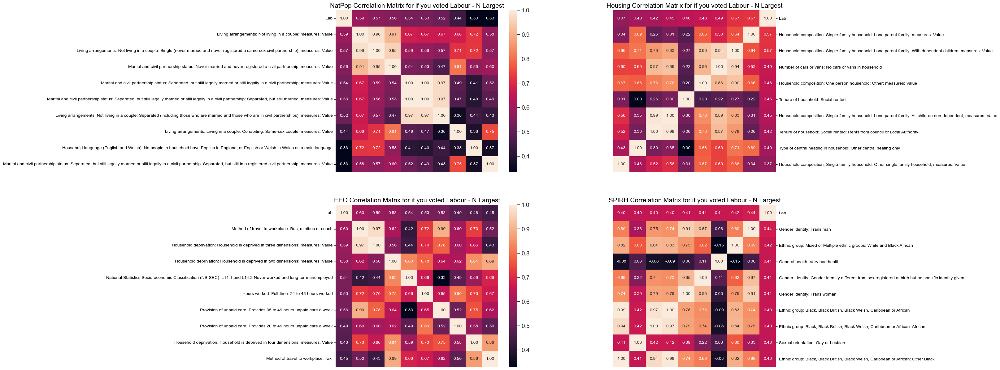

In [22]:
k = 10 #number of variables for heatmap
cols_natpop = corr_natpop.nlargest(k, 'Lab')['Lab'].index
cols_eeo = corr_eeo.nlargest(k, 'Lab')['Lab'].index
cols_housing = corr_housing.nlargest(k, 'Lab')['Lab'].index
cols_spirh = corr_spirh.nlargest(k, 'Lab')['Lab'].index

cm_n = np.corrcoef(census_natpop_GE2024_df_numeric[cols_natpop].values.T)
cm_e = np.corrcoef(census_eeo_GE2024_df_numeric[cols_eeo].values.T)
cm_h = np.corrcoef(census_housing_GE2024_df_numeric[cols_housing].values.T)
cm_s = np.corrcoef(census_spirh_GE2024_df_numeric[cols_spirh].values.T)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

sns.set(font_scale=1.25)
hm_n = sns.heatmap(cm_n, ax=axes[0, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_natpop.values, xticklabels=cols_natpop.values)
hm_n.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_h = sns.heatmap(cm_e, ax=axes[0, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_housing.values, xticklabels=cols_housing.values)
hm_h.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_h.invert_xaxis()
hm_e = sns.heatmap(cm_h, ax=axes[1, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_eeo.values, xticklabels=cols_eeo.values)
hm_e.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_s = sns.heatmap(cm_s, ax=axes[1, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_spirh.values, xticklabels=cols_spirh.values)
hm_s.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_s.invert_xaxis()

axes[0, 0].set_title('NatPop Correlation Matrix for if you voted Labour - N Largest')
axes[0, 1].set_title('Housing Correlation Matrix for if you voted Labour - N Largest')
axes[1, 0].set_title('EEO Correlation Matrix for if you voted Labour - N Largest')
axes[1, 1].set_title('SPIRH Correlation Matrix for if you voted Labour - N Largest')

plt.tight_layout
plt.show()

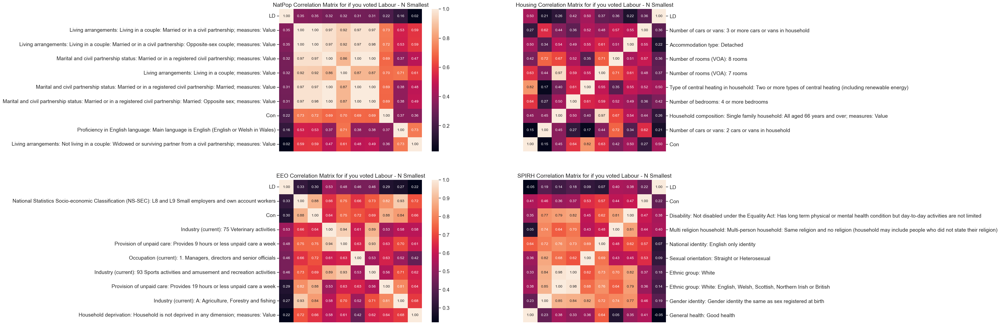

In [23]:
k = 10 #number of variables for heatmap
cols_natpop = corr_natpop.nsmallest(k, 'Lab')['Lab'].index
cols_eeo = corr_eeo.nsmallest(k, 'Lab')['Lab'].index
cols_housing = corr_housing.nsmallest(k, 'Lab')['Lab'].index
cols_spirh = corr_spirh.nsmallest(k, 'Lab')['Lab'].index

cm_n = np.corrcoef(census_natpop_GE2024_df_numeric[cols_natpop].values.T)
cm_e = np.corrcoef(census_eeo_GE2024_df_numeric[cols_eeo].values.T)
cm_h = np.corrcoef(census_housing_GE2024_df_numeric[cols_housing].values.T)
cm_s = np.corrcoef(census_spirh_GE2024_df_numeric[cols_spirh].values.T)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

sns.set(font_scale=1.25)
hm_n = sns.heatmap(cm_n, ax=axes[0, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_natpop.values, xticklabels=cols_natpop.values)
hm_n.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_h = sns.heatmap(cm_e, ax=axes[0, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_housing.values, xticklabels=cols_housing.values)
hm_h.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_h.invert_xaxis()
hm_e = sns.heatmap(cm_h, ax=axes[1, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_eeo.values, xticklabels=cols_eeo.values)
hm_e.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_s = sns.heatmap(cm_s, ax=axes[1, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_spirh.values, xticklabels=cols_spirh.values)
hm_s.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_s.invert_xaxis()

axes[0, 0].set_title('NatPop Correlation Matrix for if you voted Labour - N Smallest')
axes[0, 1].set_title('Housing Correlation Matrix for if you voted Labour - N Smallest')
axes[1, 0].set_title('EEO Correlation Matrix for if you voted Labour - N Smallest')
axes[1, 1].set_title('SPIRH Correlation Matrix for if you voted Labour - N Smallest')

plt.tight_layout
plt.show()

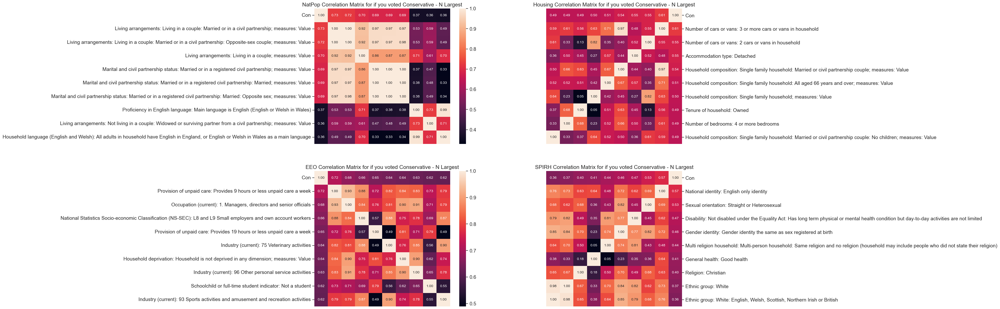

In [24]:
k = 10 #number of variables for heatmap
cols_natpop = corr_natpop.nlargest(k, 'Con')['Con'].index
cols_eeo = corr_eeo.nlargest(k, 'Con')['Con'].index
cols_housing = corr_housing.nlargest(k, 'Con')['Con'].index
cols_spirh = corr_spirh.nlargest(k, 'Con')['Con'].index

cm_n = np.corrcoef(census_natpop_GE2024_df_numeric[cols_natpop].values.T)
cm_e = np.corrcoef(census_eeo_GE2024_df_numeric[cols_eeo].values.T)
cm_h = np.corrcoef(census_housing_GE2024_df_numeric[cols_housing].values.T)
cm_s = np.corrcoef(census_spirh_GE2024_df_numeric[cols_spirh].values.T)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

sns.set(font_scale=1.25)
hm_n = sns.heatmap(cm_n, ax=axes[0, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_natpop.values, xticklabels=cols_natpop.values)
hm_n.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_h = sns.heatmap(cm_e, ax=axes[0, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_housing.values, xticklabels=cols_housing.values)
hm_h.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_h.invert_xaxis()
hm_e = sns.heatmap(cm_h, ax=axes[1, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_eeo.values, xticklabels=cols_eeo.values)
hm_e.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_s = sns.heatmap(cm_s, ax=axes[1, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_spirh.values, xticklabels=cols_spirh.values)
hm_s.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_s.invert_xaxis()

axes[0, 0].set_title('NatPop Correlation Matrix for if you voted Conservative - N Largest')
axes[0, 1].set_title('Housing Correlation Matrix for if you voted Conservative - N Largest')
axes[1, 0].set_title('EEO Correlation Matrix for if you voted Conservative - N Largest')
axes[1, 1].set_title('SPIRH Correlation Matrix for if you voted Conservative - N Largest')

plt.tight_layout
plt.show()

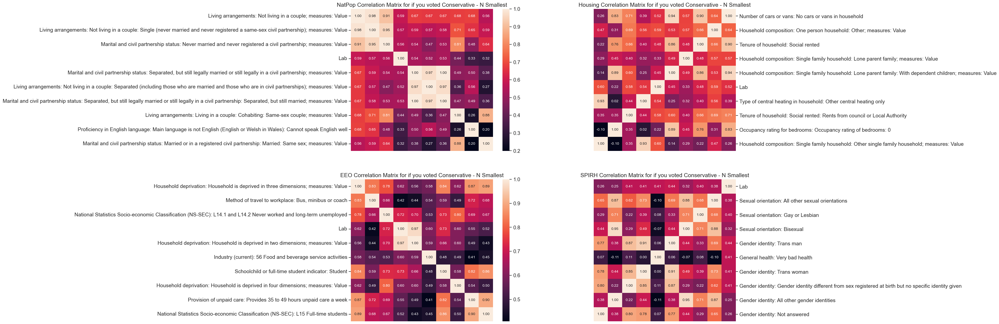

In [25]:
k = 10 #number of variables for heatmap
cols_natpop = corr_natpop.nsmallest(k, 'Con')['Con'].index
cols_eeo = corr_eeo.nsmallest(k, 'Con')['Con'].index
cols_housing = corr_housing.nsmallest(k, 'Con')['Con'].index
cols_spirh = corr_spirh.nsmallest(k, 'Con')['Con'].index

cm_n = np.corrcoef(census_natpop_GE2024_df_numeric[cols_natpop].values.T)
cm_e = np.corrcoef(census_eeo_GE2024_df_numeric[cols_eeo].values.T)
cm_h = np.corrcoef(census_housing_GE2024_df_numeric[cols_housing].values.T)
cm_s = np.corrcoef(census_spirh_GE2024_df_numeric[cols_spirh].values.T)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

sns.set(font_scale=1.25)
hm_n = sns.heatmap(cm_n, ax=axes[0, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_natpop.values, xticklabels=cols_natpop.values)
hm_n.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_h = sns.heatmap(cm_e, ax=axes[0, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_housing.values, xticklabels=cols_housing.values)
hm_h.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_h.invert_xaxis()
hm_e = sns.heatmap(cm_h, ax=axes[1, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_eeo.values, xticklabels=cols_eeo.values)
hm_e.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_s = sns.heatmap(cm_s, ax=axes[1, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_spirh.values, xticklabels=cols_spirh.values)
hm_s.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_s.invert_xaxis()

axes[0, 0].set_title('NatPop Correlation Matrix for if you voted Conservative - N Smallest')
axes[0, 1].set_title('Housing Correlation Matrix for if you voted Conservative - N Smallest')
axes[1, 0].set_title('EEO Correlation Matrix for if you voted Conservative - N Smallest')
axes[1, 1].set_title('SPIRH Correlation Matrix for if you voted Conservative - N Smallest')

plt.tight_layout
plt.show()

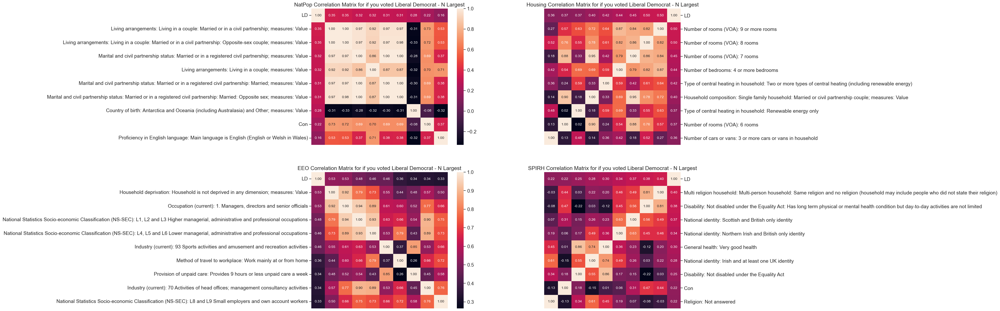

In [26]:
k = 10 #number of variables for heatmap
cols_natpop = corr_natpop.nlargest(k, 'LD')['LD'].index
cols_eeo = corr_eeo.nlargest(k, 'LD')['LD'].index
cols_housing = corr_housing.nlargest(k, 'LD')['LD'].index
cols_spirh = corr_spirh.nlargest(k, 'LD')['LD'].index

cm_n = np.corrcoef(census_natpop_GE2024_df_numeric[cols_natpop].values.T)
cm_e = np.corrcoef(census_eeo_GE2024_df_numeric[cols_eeo].values.T)
cm_h = np.corrcoef(census_housing_GE2024_df_numeric[cols_housing].values.T)
cm_s = np.corrcoef(census_spirh_GE2024_df_numeric[cols_spirh].values.T)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

sns.set(font_scale=1.25)
hm_n = sns.heatmap(cm_n, ax=axes[0, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_natpop.values, xticklabels=cols_natpop.values)
hm_n.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_h = sns.heatmap(cm_e, ax=axes[0, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_housing.values, xticklabels=cols_housing.values)
hm_h.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_h.invert_xaxis()
hm_e = sns.heatmap(cm_h, ax=axes[1, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_eeo.values, xticklabels=cols_eeo.values)
hm_e.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_s = sns.heatmap(cm_s, ax=axes[1, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_spirh.values, xticklabels=cols_spirh.values)
hm_s.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_s.invert_xaxis()

axes[0, 0].set_title('NatPop Correlation Matrix for if you voted Liberal Democrat - N Largest')
axes[0, 1].set_title('Housing Correlation Matrix for if you voted Liberal Democrat - N Largest')
axes[1, 0].set_title('EEO Correlation Matrix for if you voted Liberal Democrat - N Largest')
axes[1, 1].set_title('SPIRH Correlation Matrix for if you voted Liberal Democrat - N Largest')

plt.tight_layout
plt.show()

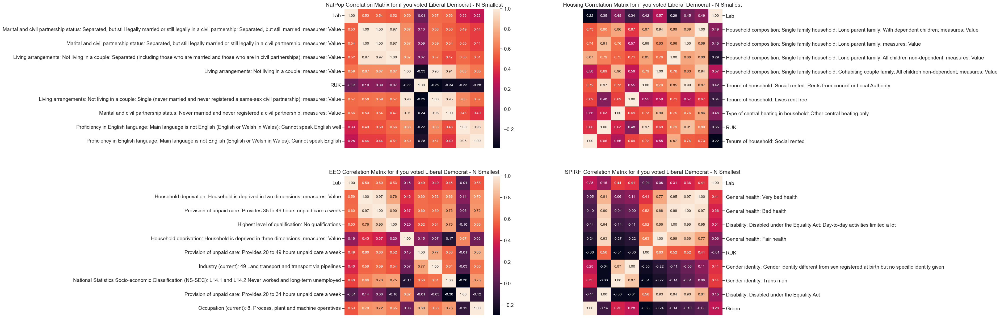

In [27]:
k = 10 #number of variables for heatmap
cols_natpop = corr_natpop.nsmallest(k, 'LD')['LD'].index
cols_eeo = corr_eeo.nsmallest(k, 'LD')['LD'].index
cols_housing = corr_housing.nsmallest(k, 'LD')['LD'].index
cols_spirh = corr_spirh.nsmallest(k, 'LD')['LD'].index

cm_n = np.corrcoef(census_natpop_GE2024_df_numeric[cols_natpop].values.T)
cm_e = np.corrcoef(census_eeo_GE2024_df_numeric[cols_eeo].values.T)
cm_h = np.corrcoef(census_housing_GE2024_df_numeric[cols_housing].values.T)
cm_s = np.corrcoef(census_spirh_GE2024_df_numeric[cols_spirh].values.T)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

sns.set(font_scale=1.25)
hm_n = sns.heatmap(cm_n, ax=axes[0, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_natpop.values, xticklabels=cols_natpop.values)
hm_n.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_h = sns.heatmap(cm_e, ax=axes[0, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_housing.values, xticklabels=cols_housing.values)
hm_h.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_h.invert_xaxis()
hm_e = sns.heatmap(cm_h, ax=axes[1, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_eeo.values, xticklabels=cols_eeo.values)
hm_e.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_s = sns.heatmap(cm_s, ax=axes[1, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_spirh.values, xticklabels=cols_spirh.values)
hm_s.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_s.invert_xaxis()

axes[0, 0].set_title('NatPop Correlation Matrix for if you voted Liberal Democrat - N Smallest')
axes[0, 1].set_title('Housing Correlation Matrix for if you voted Liberal Democrat - N Smallest')
axes[1, 0].set_title('EEO Correlation Matrix for if you voted Liberal Democrat - N Smallest')
axes[1, 1].set_title('SPIRH Correlation Matrix for if you voted Liberal Democrat - N Smallest')

plt.tight_layout
plt.show()

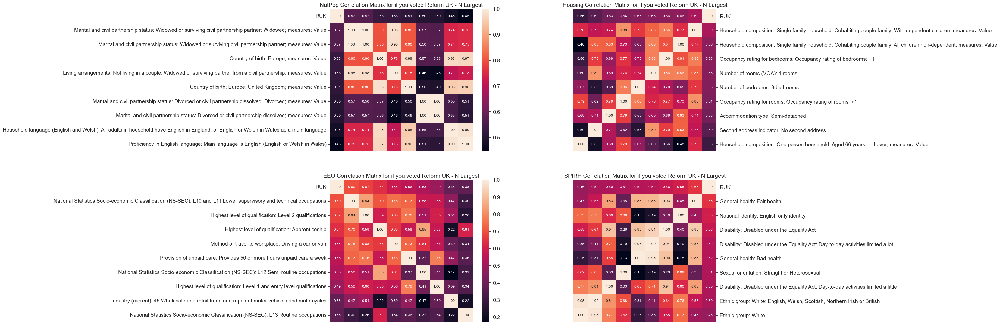

In [28]:
k = 10 #number of variables for heatmap
cols_natpop = corr_natpop.nlargest(k, 'RUK')['RUK'].index
cols_eeo = corr_eeo.nlargest(k, 'RUK')['RUK'].index
cols_housing = corr_housing.nlargest(k, 'RUK')['RUK'].index
cols_spirh = corr_spirh.nlargest(k, 'RUK')['RUK'].index

cm_n = np.corrcoef(census_natpop_GE2024_df_numeric[cols_natpop].values.T)
cm_e = np.corrcoef(census_eeo_GE2024_df_numeric[cols_eeo].values.T)
cm_h = np.corrcoef(census_housing_GE2024_df_numeric[cols_housing].values.T)
cm_s = np.corrcoef(census_spirh_GE2024_df_numeric[cols_spirh].values.T)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

sns.set(font_scale=1.25)
hm_n = sns.heatmap(cm_n, ax=axes[0, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_natpop.values, xticklabels=cols_natpop.values)
hm_n.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_h = sns.heatmap(cm_e, ax=axes[0, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_housing.values, xticklabels=cols_housing.values)
hm_h.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_h.invert_xaxis()
hm_e = sns.heatmap(cm_h, ax=axes[1, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_eeo.values, xticklabels=cols_eeo.values)
hm_e.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_s = sns.heatmap(cm_s, ax=axes[1, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_spirh.values, xticklabels=cols_spirh.values)
hm_s.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_s.invert_xaxis()

axes[0, 0].set_title('NatPop Correlation Matrix for if you voted Reform UK - N Largest')
axes[0, 1].set_title('Housing Correlation Matrix for if you voted Reform UK - N Largest')
axes[1, 0].set_title('EEO Correlation Matrix for if you voted Reform UK - N Largest')
axes[1, 1].set_title('SPIRH Correlation Matrix for if you voted Reform UK - N Largest')

plt.tight_layout
plt.show()

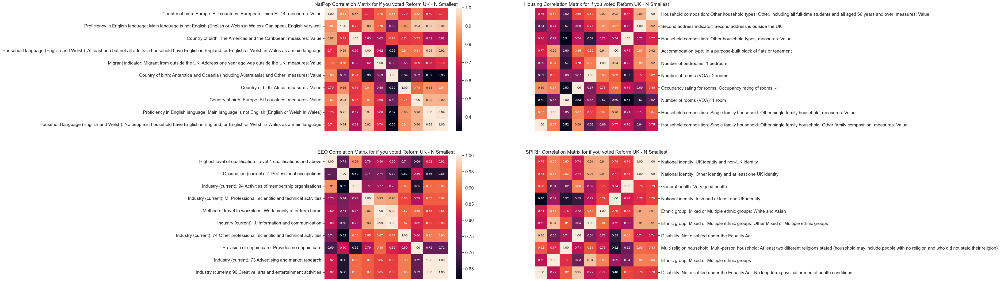

In [29]:
k = 10 #number of variables for heatmap
cols_natpop = corr_natpop.nsmallest(k, 'RUK')['RUK'].index
cols_eeo = corr_eeo.nsmallest(k, 'RUK')['RUK'].index
cols_housing = corr_housing.nsmallest(k, 'RUK')['RUK'].index
cols_spirh = corr_spirh.nsmallest(k, 'RUK')['RUK'].index

cm_n = np.corrcoef(census_natpop_GE2024_df_numeric[cols_natpop].values.T)
cm_e = np.corrcoef(census_eeo_GE2024_df_numeric[cols_eeo].values.T)
cm_h = np.corrcoef(census_housing_GE2024_df_numeric[cols_housing].values.T)
cm_s = np.corrcoef(census_spirh_GE2024_df_numeric[cols_spirh].values.T)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

sns.set(font_scale=1.25)
hm_n = sns.heatmap(cm_n, ax=axes[0, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_natpop.values, xticklabels=cols_natpop.values)
hm_n.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_h = sns.heatmap(cm_e, ax=axes[0, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_housing.values, xticklabels=cols_housing.values)
hm_h.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_h.invert_xaxis()
hm_e = sns.heatmap(cm_h, ax=axes[1, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_eeo.values, xticklabels=cols_eeo.values)
hm_e.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_s = sns.heatmap(cm_s, ax=axes[1, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_spirh.values, xticklabels=cols_spirh.values)
hm_s.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_s.invert_xaxis()

axes[0, 0].set_title('NatPop Correlation Matrix for if you voted Reform UK - N Smallest')
axes[0, 1].set_title('Housing Correlation Matrix for if you voted Reform UK - N Smallest')
axes[1, 0].set_title('EEO Correlation Matrix for if you voted Reform UK - N Smallest')
axes[1, 1].set_title('SPIRH Correlation Matrix for if you voted Reform UK - N Smallest')

plt.tight_layout
plt.show()

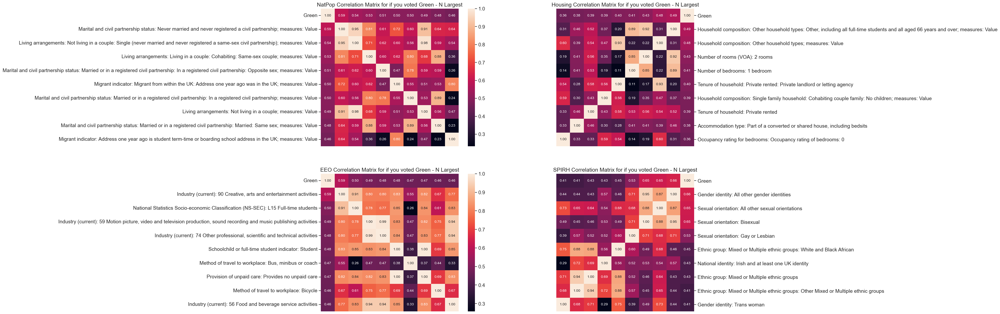

In [30]:
k = 10 #number of variables for heatmap
cols_natpop = corr_natpop.nlargest(k, 'Green')['Green'].index
cols_eeo = corr_eeo.nlargest(k, 'Green')['Green'].index
cols_housing = corr_housing.nlargest(k, 'Green')['Green'].index
cols_spirh = corr_spirh.nlargest(k, 'Green')['Green'].index

cm_n = np.corrcoef(census_natpop_GE2024_df_numeric[cols_natpop].values.T)
cm_e = np.corrcoef(census_eeo_GE2024_df_numeric[cols_eeo].values.T)
cm_h = np.corrcoef(census_housing_GE2024_df_numeric[cols_housing].values.T)
cm_s = np.corrcoef(census_spirh_GE2024_df_numeric[cols_spirh].values.T)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

sns.set(font_scale=1.25)
hm_n = sns.heatmap(cm_n, ax=axes[0, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_natpop.values, xticklabels=cols_natpop.values)
hm_n.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_h = sns.heatmap(cm_e, ax=axes[0, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_housing.values, xticklabels=cols_housing.values)
hm_h.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_h.invert_xaxis()
hm_e = sns.heatmap(cm_h, ax=axes[1, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_eeo.values, xticklabels=cols_eeo.values)
hm_e.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_s = sns.heatmap(cm_s, ax=axes[1, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_spirh.values, xticklabels=cols_spirh.values)
hm_s.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_s.invert_xaxis()

axes[0, 0].set_title('NatPop Correlation Matrix for if you voted Green - N Largest')
axes[0, 1].set_title('Housing Correlation Matrix for if you voted Green - N Largest')
axes[1, 0].set_title('EEO Correlation Matrix for if you voted Green - N Largest')
axes[1, 1].set_title('SPIRH Correlation Matrix for if you voted Green - N Largest')

plt.tight_layout
plt.show()

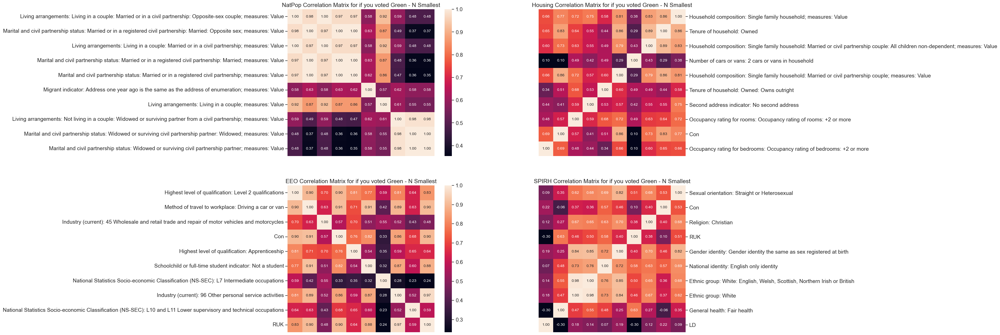

In [31]:
k = 10 #number of variables for heatmap
cols_natpop = corr_natpop.nsmallest(k, 'Green')['Green'].index
cols_eeo = corr_eeo.nsmallest(k, 'Green')['Green'].index
cols_housing = corr_housing.nsmallest(k, 'Green')['Green'].index
cols_spirh = corr_spirh.nsmallest(k, 'Green')['Green'].index

cm_n = np.corrcoef(census_natpop_GE2024_df_numeric[cols_natpop].values.T)
cm_e = np.corrcoef(census_eeo_GE2024_df_numeric[cols_eeo].values.T)
cm_h = np.corrcoef(census_housing_GE2024_df_numeric[cols_housing].values.T)
cm_s = np.corrcoef(census_spirh_GE2024_df_numeric[cols_spirh].values.T)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

sns.set(font_scale=1.25)
hm_n = sns.heatmap(cm_n, ax=axes[0, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_natpop.values, xticklabels=cols_natpop.values)
hm_n.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_h = sns.heatmap(cm_e, ax=axes[0, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_housing.values, xticklabels=cols_housing.values)
hm_h.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_h.invert_xaxis()
hm_e = sns.heatmap(cm_h, ax=axes[1, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_eeo.values, xticklabels=cols_eeo.values)
hm_e.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_s = sns.heatmap(cm_s, ax=axes[1, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_spirh.values, xticklabels=cols_spirh.values)
hm_s.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_s.invert_xaxis()

axes[0, 0].set_title('NatPop Correlation Matrix for if you voted Green - N Smallest')
axes[0, 1].set_title('Housing Correlation Matrix for if you voted Green - N Smallest')
axes[1, 0].set_title('EEO Correlation Matrix for if you voted Green - N Smallest')
axes[1, 1].set_title('SPIRH Correlation Matrix for if you voted Green - N Smallest')

plt.tight_layout
plt.show()

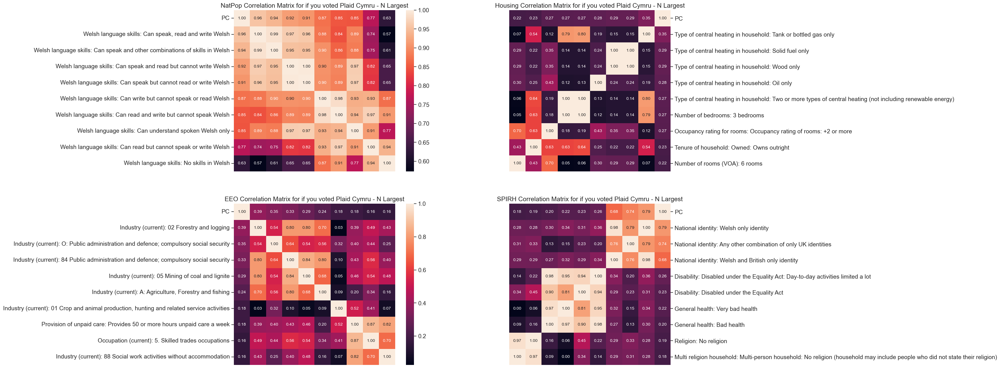

In [32]:
k = 10 #number of variables for heatmap
cols_natpop = corr_natpop.nlargest(k, 'PC')['PC'].index
cols_eeo = corr_eeo.nlargest(k, 'PC')['PC'].index
cols_housing = corr_housing.nlargest(k, 'PC')['PC'].index
cols_spirh = corr_spirh.nlargest(k, 'PC')['PC'].index

cm_n = np.corrcoef(census_natpop_GE2024_df_numeric[cols_natpop].values.T)
cm_e = np.corrcoef(census_eeo_GE2024_df_numeric[cols_eeo].values.T)
cm_h = np.corrcoef(census_housing_GE2024_df_numeric[cols_housing].values.T)
cm_s = np.corrcoef(census_spirh_GE2024_df_numeric[cols_spirh].values.T)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

sns.set(font_scale=1.25)
hm_n = sns.heatmap(cm_n, ax=axes[0, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_natpop.values, xticklabels=cols_natpop.values)
hm_n.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_h = sns.heatmap(cm_e, ax=axes[0, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_housing.values, xticklabels=cols_housing.values)
hm_h.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_h.invert_xaxis()
hm_e = sns.heatmap(cm_h, ax=axes[1, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_eeo.values, xticklabels=cols_eeo.values)
hm_e.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_s = sns.heatmap(cm_s, ax=axes[1, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_spirh.values, xticklabels=cols_spirh.values)
hm_s.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_s.invert_xaxis()

axes[0, 0].set_title('NatPop Correlation Matrix for if you voted Plaid Cymru - N Largest')
axes[0, 1].set_title('Housing Correlation Matrix for if you voted Plaid Cymru - N Largest')
axes[1, 0].set_title('EEO Correlation Matrix for if you voted Plaid Cymru - N Largest')
axes[1, 1].set_title('SPIRH Correlation Matrix for if you voted Plaid Cymru - N Largest')

plt.tight_layout
plt.show()

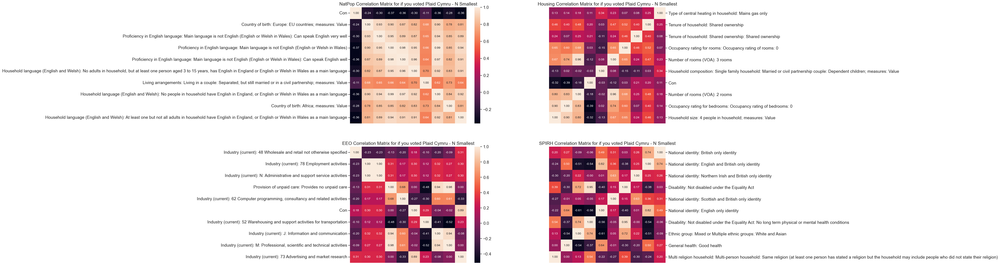

In [33]:
k = 10 #number of variables for heatmap
cols_natpop = corr_natpop.nsmallest(k, 'PC')['PC'].index
cols_eeo = corr_eeo.nsmallest(k, 'PC')['PC'].index
cols_housing = corr_housing.nsmallest(k, 'PC')['PC'].index
cols_spirh = corr_spirh.nsmallest(k, 'PC')['PC'].index

cm_n = np.corrcoef(census_natpop_GE2024_df_numeric[cols_natpop].values.T)
cm_e = np.corrcoef(census_eeo_GE2024_df_numeric[cols_eeo].values.T)
cm_h = np.corrcoef(census_housing_GE2024_df_numeric[cols_housing].values.T)
cm_s = np.corrcoef(census_spirh_GE2024_df_numeric[cols_spirh].values.T)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

sns.set(font_scale=1.25)
hm_n = sns.heatmap(cm_n, ax=axes[0, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_natpop.values, xticklabels=cols_natpop.values)
hm_n.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_h = sns.heatmap(cm_e, ax=axes[0, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_housing.values, xticklabels=cols_housing.values)
hm_h.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_h.invert_xaxis()
hm_e = sns.heatmap(cm_h, ax=axes[1, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_eeo.values, xticklabels=cols_eeo.values)
hm_e.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_s = sns.heatmap(cm_s, ax=axes[1, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_spirh.values, xticklabels=cols_spirh.values)
hm_s.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_s.invert_xaxis()

axes[0, 0].set_title('NatPop Correlation Matrix for if you voted Plaid Cymru - N Smallest')
axes[0, 1].set_title('Housing Correlation Matrix for if you voted Plaid Cymru - N Smallest')
axes[1, 0].set_title('EEO Correlation Matrix for if you voted Plaid Cymru - N Smallest')
axes[1, 1].set_title('SPIRH Correlation Matrix for if you voted Plaid Cymru - N Smallest')

plt.tight_layout
plt.show()

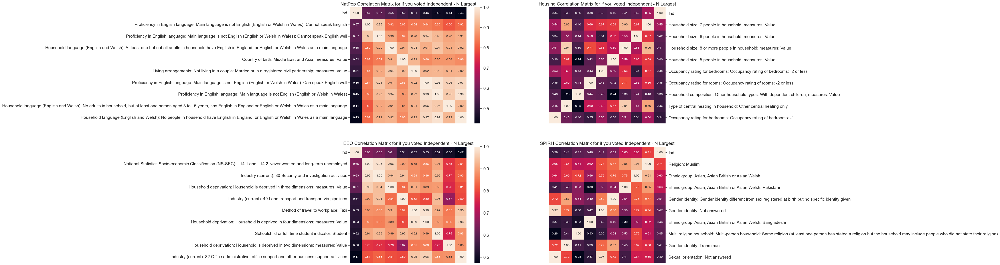

In [34]:
k = 10 #number of variables for heatmap
cols_natpop = corr_natpop.nlargest(k, 'Ind')['Ind'].index
cols_eeo = corr_eeo.nlargest(k, 'Ind')['Ind'].index
cols_housing = corr_housing.nlargest(k, 'Ind')['Ind'].index
cols_spirh = corr_spirh.nlargest(k, 'Ind')['Ind'].index

cm_n = np.corrcoef(census_natpop_GE2024_df_numeric[cols_natpop].values.T)
cm_e = np.corrcoef(census_eeo_GE2024_df_numeric[cols_eeo].values.T)
cm_h = np.corrcoef(census_housing_GE2024_df_numeric[cols_housing].values.T)
cm_s = np.corrcoef(census_spirh_GE2024_df_numeric[cols_spirh].values.T)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

sns.set(font_scale=1.25)
hm_n = sns.heatmap(cm_n, ax=axes[0, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_natpop.values, xticklabels=cols_natpop.values)
hm_n.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_h = sns.heatmap(cm_e, ax=axes[0, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_housing.values, xticklabels=cols_housing.values)
hm_h.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_h.invert_xaxis()
hm_e = sns.heatmap(cm_h, ax=axes[1, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_eeo.values, xticklabels=cols_eeo.values)
hm_e.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_s = sns.heatmap(cm_s, ax=axes[1, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_spirh.values, xticklabels=cols_spirh.values)
hm_s.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_s.invert_xaxis()

axes[0, 0].set_title('NatPop Correlation Matrix for if you voted Independent - N Largest')
axes[0, 1].set_title('Housing Correlation Matrix for if you voted Independent - N Largest')
axes[1, 0].set_title('EEO Correlation Matrix for if you voted Independent - N Largest')
axes[1,1].set_title('SPIRH Correlation Matrix for if you voted Independent - N Largest')

plt.tight_layout
plt.show()

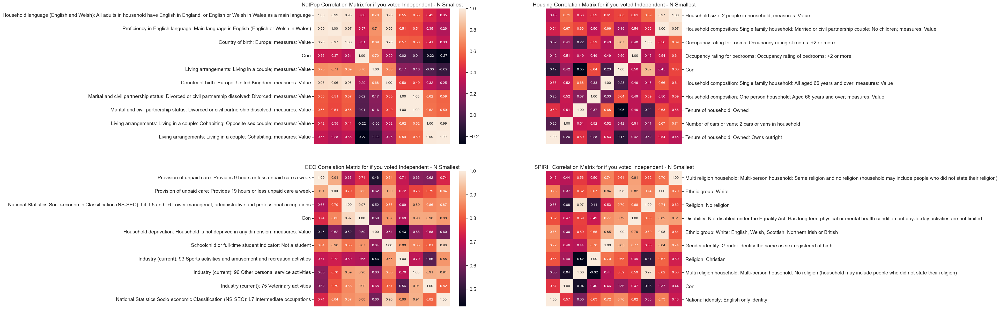

In [35]:
k = 10 #number of variables for heatmap
cols_natpop = corr_natpop.nsmallest(k, 'Ind')['Ind'].index
cols_eeo = corr_eeo.nsmallest(k, 'Ind')['Ind'].index
cols_housing = corr_housing.nsmallest(k, 'Ind')['Ind'].index
cols_spirh = corr_spirh.nsmallest(k, 'Ind')['Ind'].index

cm_n = np.corrcoef(census_natpop_GE2024_df_numeric[cols_natpop].values.T)
cm_e = np.corrcoef(census_eeo_GE2024_df_numeric[cols_eeo].values.T)
cm_h = np.corrcoef(census_housing_GE2024_df_numeric[cols_housing].values.T)
cm_s = np.corrcoef(census_spirh_GE2024_df_numeric[cols_spirh].values.T)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

sns.set(font_scale=1.25)
hm_n = sns.heatmap(cm_n, ax=axes[0, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_natpop.values, xticklabels=cols_natpop.values)
hm_n.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_h = sns.heatmap(cm_e, ax=axes[0, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_housing.values, xticklabels=cols_housing.values)
hm_h.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_h.invert_xaxis()
hm_e = sns.heatmap(cm_h, ax=axes[1, 0], cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_eeo.values, xticklabels=cols_eeo.values)
hm_e.tick_params(left=True, bottom=False, labelleft=True, labelbottom=False, right=False, top=False, labelright=False, labeltop=False, labelrotation=0)
hm_s = sns.heatmap(cm_s, ax=axes[1, 1], cbar=False, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=cols_spirh.values, xticklabels=cols_spirh.values)
hm_s.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, right=True, top=False, labelright=True, labeltop=False, labelrotation=0)
hm_s.invert_xaxis()

axes[0, 0].set_title('NatPop Correlation Matrix for if you voted Independent - N Smallest')
axes[0, 1].set_title('Housing Correlation Matrix for if you voted Independent - N Smallest')
axes[1, 0].set_title('EEO Correlation Matrix for if you voted Independent - N Smallest')
axes[1,1].set_title('SPIRH Correlation Matrix for if you voted Independent - N Smallest')

plt.tight_layout
plt.show()

## 2.2 Some other plots

Let's do some more plots to gleam some more info.

A pairplot could be handy to see how much how much voters bleed into each other. How convict in their votes are labour voters compared to plaid voters.
*The way I interpret these is that 'X axis' is our 'likelihood' to vote for that party and the 'y axis' is our 'shared probability' of voting for another party'*
- All of these should have a negative correlation; obviously, your're less likely to vote for one party the more likely you are to vote for another, but the intercept is interesting.
- Looking at Plaid, most cluster around 0 but that's because most people don't vote Plaid. But at the 'non-zero' values, we can that they tend to vote for Labour than Conservative (except at the extreme ends)
- This is mostly an exercise in me seeing what cool stuff I can gleam from this.

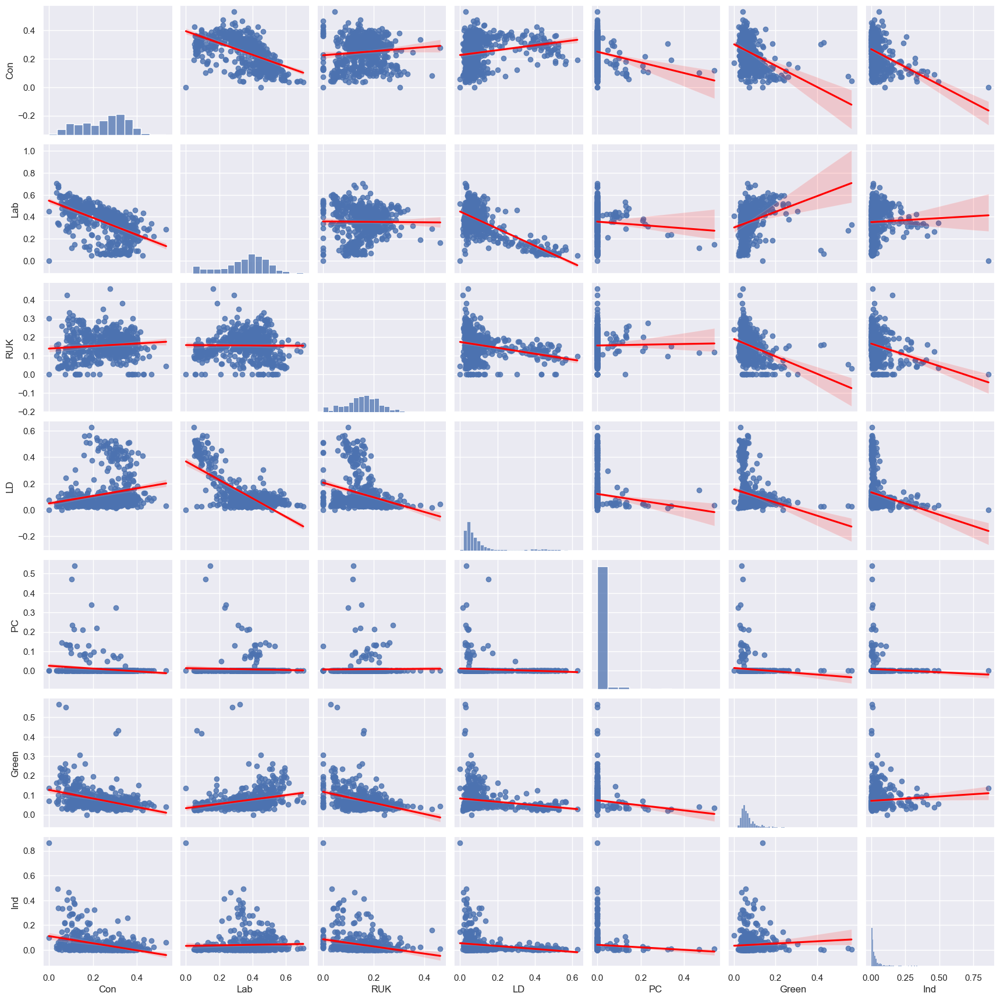

In [36]:
sns.set()
cols = ['Con', 'Lab', 'RUK', 'LD', 'PC', 'Green', 'Ind']
pp=sns.pairplot(census_natpop_GE2024_df[cols],kind='reg',plot_kws={'line_kws':{'color':'red'}})
plt.show()

I don't think this plot is very useful, but it's cool to look at.
I don't think this next plot is very useful either but I think it is very interesting. Basically, what did the share of the vote did a party win a constituency with. Basically tells us how popular the party was, the higher the mean, the more liked they were in the constituency.

In [37]:
lab = census_natpop_GE2024_df[census_natpop_GE2024_df['Elected'] == 'Lab']
con = census_natpop_GE2024_df[census_natpop_GE2024_df['Elected'] == 'Con']
ld = census_natpop_GE2024_df[census_natpop_GE2024_df['Elected'] == 'LD']
ruk = census_natpop_GE2024_df[census_natpop_GE2024_df['Elected'] == 'RUK']
green = census_natpop_GE2024_df[census_natpop_GE2024_df['Elected'] == 'Green']
pc = census_natpop_GE2024_df[census_natpop_GE2024_df['Elected'] == 'PC']
ind = census_natpop_GE2024_df[census_natpop_GE2024_df['Elected'] == 'Ind']

Text(0.5, 1.0, 'Vote share for (all) winning party of a Consituency')

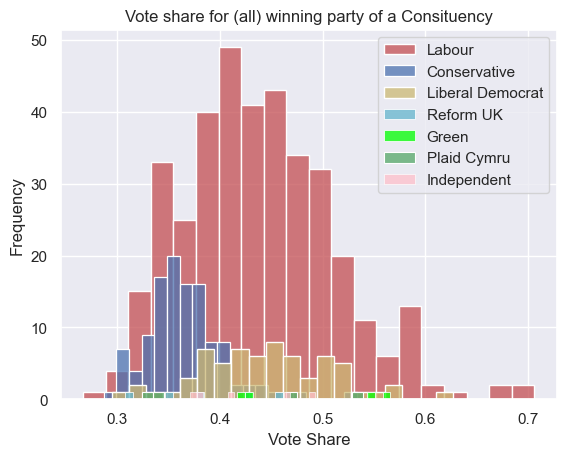

In [38]:
n_bins = 20
ax = sns.histplot(lab["Lab"], bins=n_bins, label = "Labour", color='r')
ax = sns.histplot(con["Con"], bins=n_bins, label = "Conservative", color='b')
ax = sns.histplot(ld["LD"], bins=n_bins, label = "Liberal Democrat", color='y')
ax = sns.histplot(ruk["RUK"], bins=n_bins, label = "Reform UK", color='c')
ax = sns.histplot(green["Green"], bins=n_bins, label = "Green", color='lime')
ax = sns.histplot(pc["PC"], bins=n_bins, label = "Plaid Cymru", color='g')
ax = sns.histplot(ind["Ind"], bins=n_bins, label = "Independent", color='pink')
ax.legend()
ax.set(xlabel='Vote Share', ylabel='Frequency')
ax.set_title('Vote share for (all) winning party of a Consituency')

Text(0.5, 1.0, 'Vote share for (smaller) winning party of a Consituency')

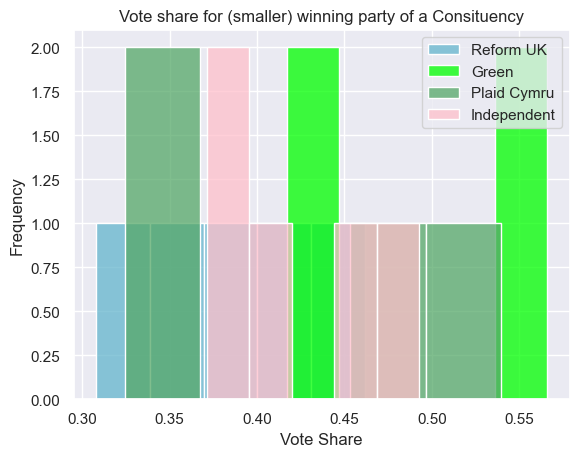

In [39]:
n_bins = 5
ax = sns.histplot(ruk["RUK"], bins=n_bins, label = "Reform UK", color='c')
ax = sns.histplot(green["Green"], bins=n_bins, label = "Green", color='lime')
ax = sns.histplot(pc["PC"], bins=n_bins, label = "Plaid Cymru", color='g')
ax = sns.histplot(ind["Ind"], bins=n_bins, label = "Independent", color='pink')
ax.legend()
ax.set(xlabel='Vote Share', ylabel='Frequency')
ax.set_title('Vote share for (smaller) winning party of a Consituency')

In [40]:
print("Labour - Description")
lab['Lab'].describe()

Labour - Description


count    374.000000
mean       0.437075
std        0.073527
min        0.267216
25%        0.385481
50%        0.432878
75%        0.482188
max        0.705742
Name: Lab, dtype: float64

In [41]:
print("Conservative - Description")
con['Con'].describe()

Conservative - Description


count    116.000000
mean       0.365237
std        0.038101
min        0.287006
25%        0.341226
50%        0.359545
75%        0.382944
max        0.533018
Name: Con, dtype: float64

In [42]:
print("Liberal Democrat - Description")
ld['LD'].describe()

Liberal Democrat - Description


count    66.000000
mean      0.445419
std       0.064063
min       0.295093
25%       0.398270
50%       0.445167
75%       0.490110
max       0.627077
Name: LD, dtype: float64

In [43]:
print("Reform UK - Description")
ruk['RUK'].describe()

Reform UK - Description


count    5.000000
mean     0.386846
std      0.060590
min      0.307922
25%      0.353023
50%      0.383636
75%      0.427812
max      0.461835
Name: RUK, dtype: float64

In [44]:
print("Green - Description")
green['Green'].describe()

Green - Description


count    4.000000
mean     0.491181
std      0.077676
min      0.417081
25%      0.427967
50%      0.490887
75%      0.554102
max      0.565871
Name: Green, dtype: float64

In [45]:
print("Plaid Cymru - Description")
pc['PC'].describe()

Plaid Cymru - Description


count    4.000000
mean     0.418436
std      0.103513
min      0.324568
25%      0.336383
50%      0.404902
75%      0.486956
max      0.539374
Name: PC, dtype: float64

In [46]:
print("Independent - Description")
ind['Ind'].describe()

Independent - Description


count    5.000000
mean     0.424112
std      0.052998
min      0.371346
25%      0.380644
50%      0.410848
75%      0.464885
max      0.492838
Name: Ind, dtype: float64

Frankly, it's clear that the Conservatives, Independent and Reform UK were unpopular and won by a very small margin quite often. Compared to Liberal Democrats, Green, Plaid Cymru and Labour who hover just about the 50% mark, so not quite the "clear majority" but more support than the cons.
However, it is quite clear that Independent, Plaid, Green and Reform comprise a small portion of the actual data set so it's likely that these will have very poor fits.

# 3. Individual Models
So let's build our ML model then.

Just thinking actually, I said there are 575 constituencies. 32 in Wales and 543 in England. If we do a 60-20-20 split, that would mean that Wales (in an ideal random split) would have constituency make-up like 20-6-6, or 19-7-6, or some other similar permutation.
This does mean all of the PC votes (a total of 4), could end up in one split. Which would be bad for the other two splits. This also follows with Green and Reform, as these also have a small pool of data to pull from. 
It may be wise to group these smaller parties into an 'other' category.

Despite my joined Census-Election dataframe, I'm going to go back to my separated table as that's basically my X and Y there.

In [47]:
X1 = census_housing_pcon_df.copy()
X2 = census_eeo_pcon_df.copy()
X3 = census_spirh_pcon_df.copy()
X4 = census_natpop_pcon_df.copy()

X_labels = ["Housing", "EEO", "SPIRH", "NatPop"]

# Merge them together
"""X = X1.merge(X2, on='PCON25CD', how='inner', copy=False)
X = X.merge(X3, on='PCON25CD', how='inner', copy=False)
X = X.merge(X4, on='PCON25CD', how='inner', copy=False)"""

X_index = X1["PCON25CD"] # Index list (just in case)
X1.drop(columns=['PCON25CD'], inplace=True, axis=1)  # drop useless cols
X2.drop(columns=['PCON25CD'], inplace=True, axis=1)  # drop useless cols
X3.drop(columns=['PCON25CD'], inplace=True, axis=1)  # drop useless cols
X4.drop(columns=['PCON25CD'], inplace=True, axis=1)  # drop useless cols
X1.head()


,Household composition: One person household; measures: Value,Household composition: One person household: Aged 66 years and over; measures: Value,Household composition: One person household: Other; measures: Value,Household composition: Single family household; measures: Value,Household composition: Single family household: All aged 66 years and over; measures: Value,Household composition: Single family household: Married or civil partnership couple; measures: Value,Household composition: Single family household: Married or civil partnership couple: No children; measures: Value,Household composition: Single family household: Married or civil partnership couple: Dependent children; measures: Value,Household composition: Single family household: Married or civil partnership couple: All children non-dependent; measures: Value,Household composition: Single family household: Cohabiting couple family; measures: Value,...,Tenure of household: Social rented,Tenure of household: Social rented: Rents from council or Local Authority,Tenure of household: Social rented: Other social rented,Tenure of household: Private rented,Tenure of household: Private rented: Private landlord or letting agency,Tenure of household: Private rented: Other private rented,Tenure of household: Lives rent free,Second address indicator: No second address,Second address indicator: Second address is in the UK,Second address indicator: Second address is outside the UK
0,0.101724,0.041287,0.060437,0.255442,0.031313,0.135045,0.041287,0.066815,0.026943,0.046373,...,0.075273,0.010876,0.064397,0.098553,0.076610,0.021943,0.000340,0.955400,0.034559,0.010041
1,0.110413,0.061412,0.049002,0.262932,0.047432,0.127846,0.041350,0.055702,0.030794,0.043439,...,0.065887,0.024023,0.041864,0.053688,0.045505,0.008183,0.000463,0.971540,0.024269,0.004191
2,0.107241,0.053361,0.053880,0.264396,0.039670,0.149831,0.037687,0.088393,0.023751,0.037615,...,0.056113,0.014698,0.041416,0.070837,0.063016,0.007821,0.000249,0.948677,0.036544,0.014779
3,0.120456,0.054911,0.065546,0.258307,0.043330,0.118261,0.049547,0.045387,0.023327,0.054479,...,0.070500,0.023149,0.047351,0.073625,0.064192,0.009433,0.000480,0.964695,0.031730,0.003575
4,0.113074,0.067652,0.045423,0.267790,0.063775,0.136403,0.054970,0.057092,0.024341,0.037110,...,0.057725,0.010748,0.046977,0.071151,0.057871,0.013280,0.000230,0.943852,0.039751,0.016397


In [48]:
Y = GE2024_frac_df.copy()
#other_cols = ['PC', 'RUK', 'Green','Ind','LD']
#Y['Other'] = Y[other_cols].sum(axis=1)
#Y.drop(columns=other_cols, inplace=True)
Y_index_names = Y["PCON25NM"]
Y.drop(columns=["PCON25NM"], inplace=True)
#Y['Elected'].replace({'LD':'Other','PC':'Other','RUK':'Other','Green':'Other','Ind':'Other'}, inplace=True)
Y.head()

,PCON25CD,Elected,Con,Lab,LD,RUK,Green,PC,Ind
0,W07000081,Lab,0.081191,0.498895,0.025619,0.209313,0.030597,0.131982,0.022402
1,S14000060,SNP,0.213373,0.463428,0.093716,0.137182,0.046259,0.000000,0.046042
2,S14000061,SNP,0.362971,0.367949,0.093826,0.102756,0.051683,0.000000,0.020815
3,S14000062,SNP,0.505923,0.156714,0.112481,0.224882,0.000000,0.000000,0.000000
4,S14000063,Lab,0.066924,0.744653,0.028609,0.117236,0.000000,0.000000,0.042578


This caused more annoyance than it should but I couldn't work out what party "Spk" was then I realised it was the Speaker.
So drop row 137 to bin him off

In [49]:
# Get rid of the speaker
X1 = X1.drop(137)
X2 = X2.drop(137)
X3 = X3.drop(137)
X4 = X4.drop(137)
Y = Y.drop(137)

# Calculate the proportion of votes that labour got
lab_count = Y['Elected'].value_counts().get('Lab', 0)
total_count = Y['Elected'].count()
lab_percentage = (lab_count  / total_count) * 100
print("Labour obtained: %.2f%% of the constituencies" % lab_percentage)

Labour obtained: 63.33% of the constituencies


As we can see Labour have a lot more than 25% of the seats, so we can assume that actually our null hypothesis would be that "Our model is no better than just guessing labour" which should have an accuracy of approximately 65%.

We need to ensure our model is accurate more than 65% for us to be able to say that it's actually doing anything.

Now I can't decided if the 'Elected' Tab or the Percent Tabs are better so I'll just separate these into two different ones.

Also let's delete the Scottish and Irish data.

In [50]:
Y = Y[Y["PCON25CD"].str.contains("S") == False]
Y = Y[Y["PCON25CD"].str.contains("N") == False]
Y_index = Y["PCON25CD"]
Y1 = Y.copy().drop(columns=['Elected','PCON25CD'])
Y2 = Y.copy().loc[:, 'Elected']
Y1.head()

,Con,Lab,LD,RUK,Green,PC,Ind
0,0.081191,0.498895,0.025619,0.209313,0.030597,0.131982,0.022402
5,0.290067,0.407136,0.083471,0.169125,0.044393,0.000000,0.005809
6,0.388663,0.283706,0.042897,0.242056,0.042677,0.000000,0.000000
8,0.323097,0.404221,0.091872,0.096420,0.071892,0.000000,0.012497
9,0.181877,0.423926,0.047589,0.221262,0.044386,0.044663,0.036297


In [51]:
Y2.head()

0    Lab
5    Lab
6    Con
8    Lab
9    Lab
Name: Elected, dtype: object

We need to get "SMOTE" in here as the size of any other party (and Independent) compared to Labour is tiny. So we'll oversample to get some more data!

In [52]:
party_to_num_map = {'Lab': 0, 'Con': 1, 'LD': 2, 'Green': 3, 'RUK': 4, 'PC': 5, 'Ind': 6}
num_to_party_map = {v: k for k, v in party_to_num_map.items()}
Y2.replace(party_to_num_map,inplace=True)
#Y2 = pd.to_numeric(Y2, errors='coerce')

C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\2072174689.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  Y2.replace(party_to_num_map,inplace=True)


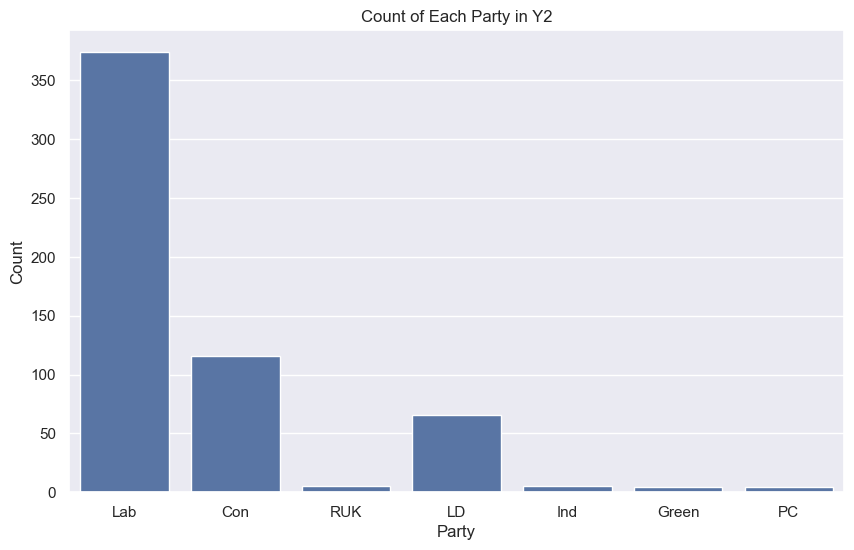

In [53]:
# Plot a count plot
plt.figure(figsize=(10, 6))
sns.countplot(x=Y2.replace(num_to_party_map))
plt.title('Count of Each Party in Y2')
plt.xlabel('Party')
plt.ylabel('Count')
plt.show()

In [54]:
sm = SMOTE(random_state=42, k_neighbors=3)
X_res1, Y2_res1 = sm.fit_resample(X1, Y2)
X_res2, Y2_res2 = sm.fit_resample(X2, Y2)
X_res3, Y2_res3 = sm.fit_resample(X3, Y2)
X_res4, Y2_res4 = sm.fit_resample(X4, Y2)

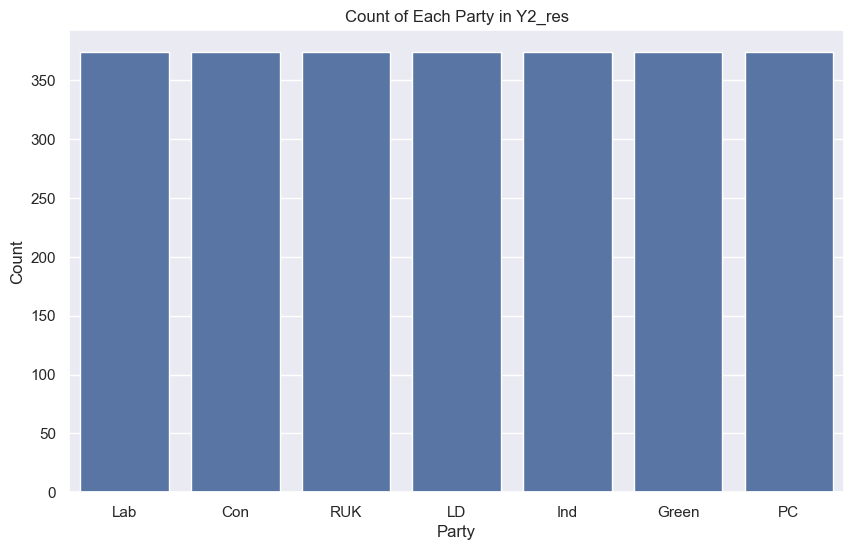

In [55]:
# Plot a count plot
plt.figure(figsize=(10, 6))
sns.countplot(x=Y2_res1.replace(num_to_party_map))
plt.title('Count of Each Party in Y2_res')
plt.xlabel('Party')
plt.ylabel('Count')
plt.show()

In [56]:
"""kbins = KBinsDiscretizer(n_bins=7, encode='ordinal', strategy='uniform')
Y1_binned = kbins.fit_transform(Y1.to_numpy().reshape(-1, 1)).ravel()
print(Y1_binned)"""
"""smote = SMOTE(random_state=42)
X_res, Y1_res = smote.fit_resample(X, Y1)
print(Y1)"""

'smote = SMOTE(random_state=42)\nX_res, Y1_res = smote.fit_resample(X, Y1)\nprint(Y1)'

In [57]:
#x1_train, x1_test, y1_train, y1_test = train_test_split(X1, Y1, test_size=0.2, random_state=random_code)
x2_train1, x2_test1, y2_train1, y2_test1 = train_test_split(X_res1, Y2_res1, test_size=0.2, random_state=random_code)
x2_train2, x2_test2, y2_train2, y2_test2 = train_test_split(X_res2, Y2_res2, test_size=0.2, random_state=random_code)
x2_train3, x2_test3, y2_train3, y2_test3 = train_test_split(X_res3, Y2_res3, test_size=0.2, random_state=random_code)
x2_train4, x2_test4, y2_train4, y2_test4 = train_test_split(X_res4, Y2_res4, test_size=0.2, random_state=random_code)
x2_train = [x2_train1, x2_train2, x2_train3, x2_train4]
x2_test = [x2_test1, x2_test2, x2_test3, x2_test4]
y2_train = [y2_train1, y2_train2, y2_train3, y2_train4]
y2_test = [y2_test1, y2_test2, y2_test3, y2_test4]

Okay so this is our final total in the test data, we have to get a 62% or better technically. But, should aim for 65%.

## 3.1 Decision Tree Classifier

Fitting 5 folds for each of 1008 candidates, totalling 5040 fits


c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
1260 fits failed out of a total of 5040.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
700 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 1382, in wrapper
    estimator._validate_params()
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 436, in _validate_params
    validate_parameter_constra

Best parameters found:  {'criterion': 'entropy', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'random'}


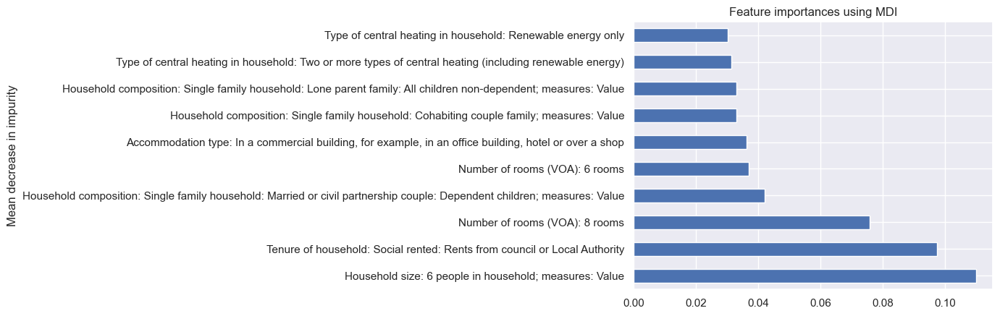

Housing  - Accuracy: 0.836
Fitting 5 folds for each of 1008 candidates, totalling 5040 fits


c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
1260 fits failed out of a total of 5040.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
700 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 1382, in wrapper
    estimator._validate_params()
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 436, in _validate_params
    validate_parameter_constra

Best parameters found:  {'criterion': 'gini', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}


C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\3613413480.py:50: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


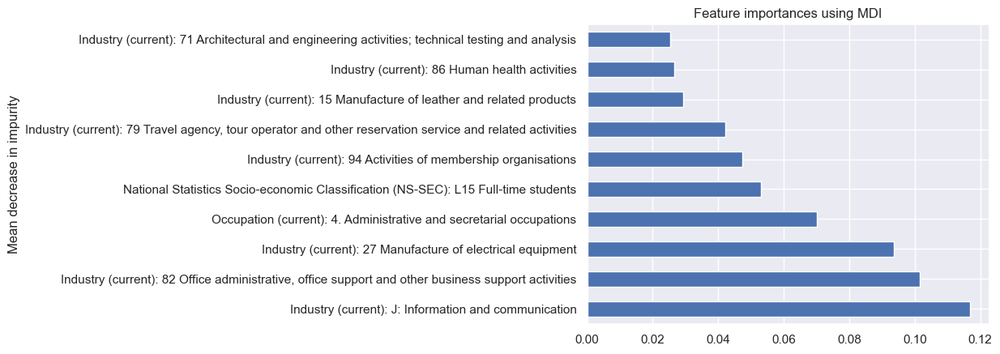

EEO  - Accuracy: 0.849
Fitting 5 folds for each of 1008 candidates, totalling 5040 fits


c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
1260 fits failed out of a total of 5040.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
688 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 1382, in wrapper
    estimator._validate_params()
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 436, in _validate_params
    validate_parameter_constra

Best parameters found:  {'criterion': 'entropy', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}


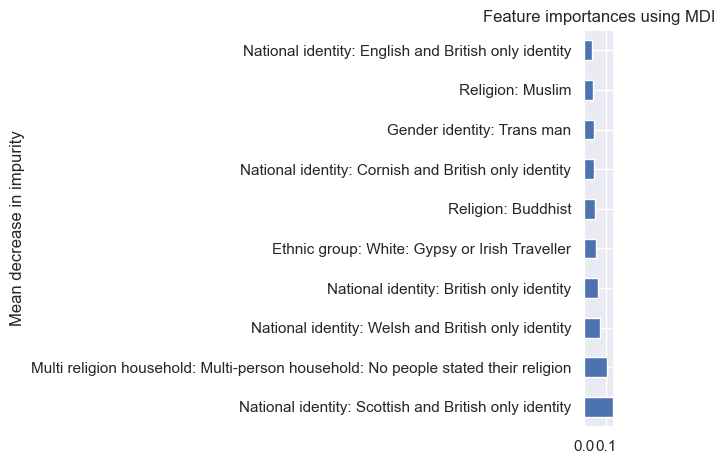

SPIRH  - Accuracy: 0.815
Fitting 5 folds for each of 1008 candidates, totalling 5040 fits


c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
1260 fits failed out of a total of 5040.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
653 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 1382, in wrapper
    estimator._validate_params()
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 436, in _validate_params
    validate_parameter_constra

Best parameters found:  {'criterion': 'gini', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}


C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\3613413480.py:50: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


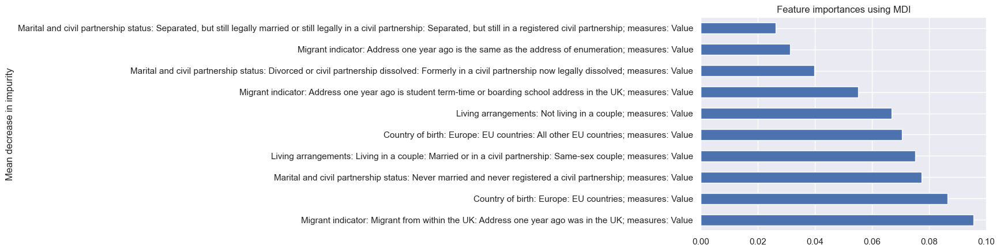

NatPop  - Accuracy: 0.802


"plt.figure(figsize = [60.0, 20.0])\n\nclass_names = [str(cls) for cls in tree.classes_]\n\n_ = plot_tree(tree, \n              feature_names = x2_test.columns, \n              class_names = class_names,\n              filled = True, \n              rounded = False, \n              proportion = True, \n              fontsize = 11) \nfor o in _:\n    arrow = o.arrow_patch\n    if arrow is not None:\n        arrow.set_edgecolor('red')\n        arrow.set_linewidth(3)"

In [58]:
param_grid = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [None,5, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'auto', 'sqrt', 'log2']
}

tree_models = []
tree_scores = []

for idx in range(len(x2_train)):
    # Define an initial tree
    tree = DecisionTreeClassifier(random_state = random_code)

    # Perform Grid Search
    grid_search = GridSearchCV(estimator=tree, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
    grid_search.fit(x2_train[idx], y2_train[idx])
    best_params = grid_search.best_params_

    print("Best parameters found: ", best_params)

    # Build a new tree based on the best parameters
    tree_best = DecisionTreeClassifier(**best_params, random_state=random_code)
    tree_best.fit(x2_train[idx], y2_train[idx])

    # Define the feature importances and sort them in descending order
    importances = tree_best.feature_importances_
    indices = np.argsort(importances)[::-1]

    """print("Feature ranking:")
    for f in range(x2_train.shape[1]):
        print(f"{f + 1}. feature {indices[f]} ({importances[indices[f]]})")"""
        
    top_features_indices = indices[:10]  # Adjust the number of top features as needed
    top_features = x2_train[idx].columns[top_features_indices]

    # Calculate the importances and standard deviations for the top features
    plot_importances = tree_best.feature_importances_[top_features_indices]

    # Create a Series for the top feature importances
    tree_importances = pd.Series(plot_importances, index=top_features)

    # Plot the importances with error bars
    fig, ax = plt.subplots()
    tree_importances.plot.barh(ax=ax)
    ax.set_title("Feature importances using MDI")
    ax.set_ylabel("Mean decrease in impurity")
    fig.tight_layout()
    plt.show()

    # Assuming 'importances' and 'indices' are already defined
    top_features_indices = indices[:10]  # Adjust the number of top features as needed
    top_features = x2_train[idx].columns[top_features_indices]

    # Select the top features from the DataFrame
    x2_train_top = x2_train[idx][top_features]
    x2_test_top = x2_test[idx][top_features]

    # Train the model with top features
    tree_top = DecisionTreeClassifier(**best_params, random_state=random_code)
    tree = tree_top.fit(x2_train_top, y2_train[idx])
    
    tree_prediction = tree.predict(x2_test_top)
    tree_models.append(tree)
    score = round(accuracy_score(y2_test[idx],tree_prediction), 3)
    tree_scores.append(score)
    print(X_labels[idx], " - Accuracy:", score)

"""plt.figure(figsize = [60.0, 20.0])

class_names = [str(cls) for cls in tree.classes_]

_ = plot_tree(tree, 
              feature_names = x2_test.columns, 
              class_names = class_names,
              filled = True, 
              rounded = False, 
              proportion = True, 
              fontsize = 11) 
for o in _:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('red')
        arrow.set_linewidth(3)"""

## 3.2 Random Forest Classifier
Let's first try with a random forest. We'll start with some initial values and do our model optimisation later.

Fitting 3 folds for each of 648 candidates, totalling 1944 fits


c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
648 fits failed out of a total of 1944.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
349 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 1382, in wrapper
    estimator._validate_params()
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 436, in _validate_params
    validate_parameter_constrai

Best parameters found:  {'bootstrap': False, 'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\2228642113.py:51: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


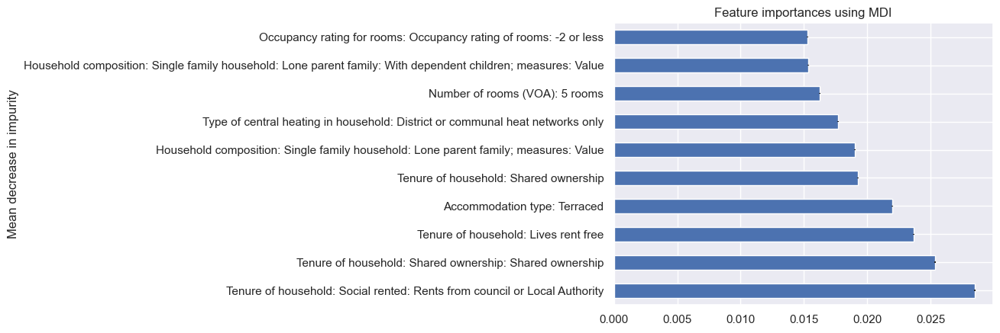

The CV Score for the training data is 0.885%, and for the test data it is 0.748%
Housing  - Accuracy: 0.885
Fitting 3 folds for each of 648 candidates, totalling 1944 fits


c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
648 fits failed out of a total of 1944.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
305 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 1382, in wrapper
    estimator._validate_params()
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 436, in _validate_params
    validate_parameter_constrai

Best parameters found:  {'bootstrap': False, 'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}


C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\2228642113.py:51: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


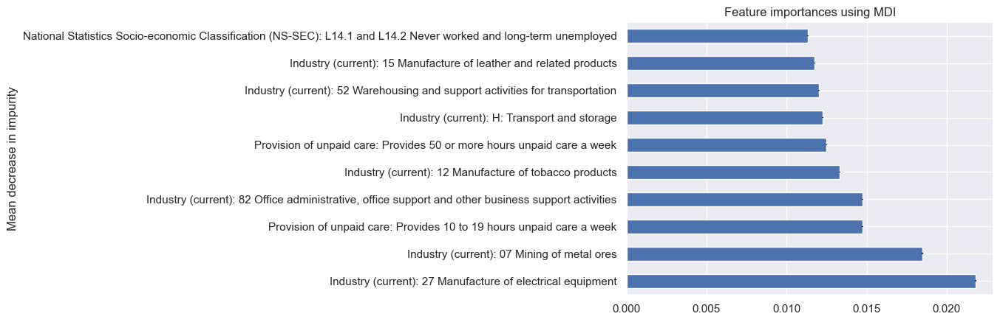

The CV Score for the training data is 0.910%, and for the test data it is 0.805%
EEO  - Accuracy: 0.914
Fitting 3 folds for each of 648 candidates, totalling 1944 fits


c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
648 fits failed out of a total of 1944.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
370 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 1382, in wrapper
    estimator._validate_params()
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 436, in _validate_params
    validate_parameter_constrai

Best parameters found:  {'bootstrap': False, 'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


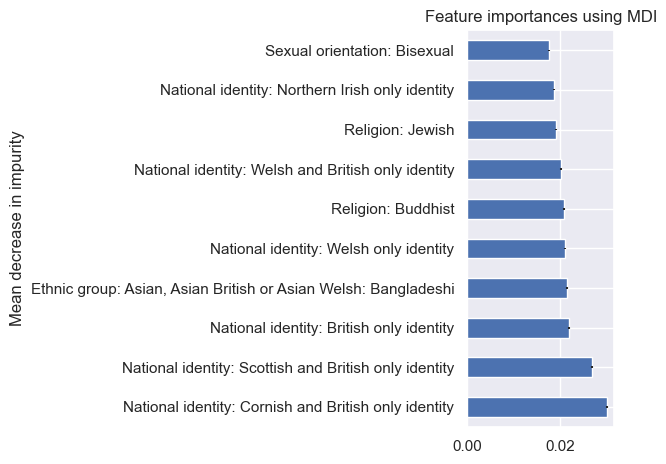

The CV Score for the training data is 0.896%, and for the test data it is 0.746%
SPIRH  - Accuracy: 0.899
Fitting 3 folds for each of 648 candidates, totalling 1944 fits


c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
648 fits failed out of a total of 1944.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
235 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 1382, in wrapper
    estimator._validate_params()
  File "c:\Users\roryj\Anaconda3\envs\DataSci\Lib\site-packages\sklearn\base.py", line 436, in _validate_params
    validate_parameter_constrai

Best parameters found:  {'bootstrap': False, 'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\2228642113.py:51: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


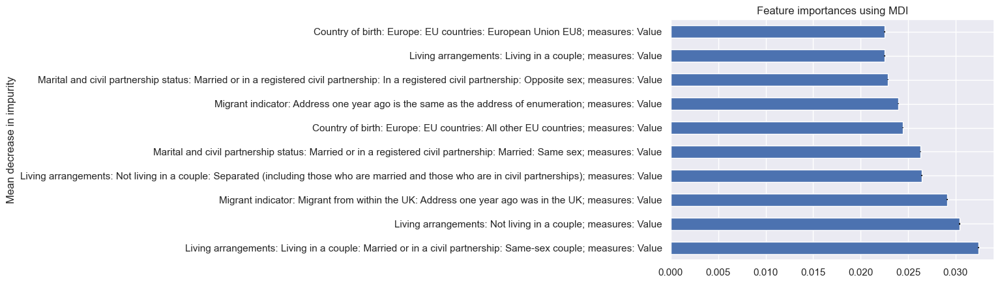

The CV Score for the training data is 0.889%, and for the test data it is 0.754%
NatPop  - Accuracy: 0.884


In [59]:
# Init the param grid and the model
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

rfc_models = []
rfc_scores = []

for idx in range(len(x2_train)):
    rfc_ = RandomForestClassifier(random_state = random_code)

    # Grid search to find the best parameters
    grid_search = GridSearchCV(estimator=rfc_, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
    grid_search.fit(x2_train[idx], y2_train[idx])
    best_params = grid_search.best_params_
    print("Best parameters found: ", best_params)

    # Generate new model and predict based on the best parameters
    rfc_best = RandomForestClassifier(**best_params, random_state=random_code)
    rfc = rfc_best.fit(x2_train[idx],y2_train[idx])

    # Get the feature importances and sort them in descending order
    importances = rfc.feature_importances_
    indices = np.argsort(importances)[::-1]

    """print("Feature ranking:")
    for f in range(x2_train.shape[1]):
        print(f"{f + 1}. feature {indices[f]} ({importances[indices[f]]})")"""
        
    # Assuming 'importances' and 'indices' are already defined
    top_features_indices = indices[:10]  # Adjust the number of top features as needed
    top_features = x2_train[idx].columns[top_features_indices]

    # Calculate the importances and standard deviations for the top features
    plot_importances = rfc.feature_importances_[top_features_indices]
    std = np.std([tree.feature_importances_[top_features_indices] for tree in rfc.estimators_], axis=0)

    # Create a Series for the top feature importances
    forest_importances = pd.Series(plot_importances, index=top_features)

    # Plot the importances with error bars
    fig, ax = plt.subplots()
    forest_importances.plot.barh(yerr=std, ax=ax)
    ax.set_title("Feature importances using MDI")
    ax.set_ylabel("Mean decrease in impurity")
    fig.tight_layout()
    plt.show()

    # Assuming 'importances' and 'indices' are already defined
    top_features_indices = indices[:10]  # Adjust the number of top features as needed
    top_features = x2_train[idx].columns[top_features_indices]

    # Select the top features from the DataFrame
    x2_train_top = x2_train[idx][top_features]
    x2_test_top = x2_test[idx][top_features]

    # Train the model with top features
    rfc_top = RandomForestClassifier(**best_params, random_state=random_code)
    rfc = rfc_top.fit(x2_train_top, y2_train[idx])

    # Cross validate the accuracy
    accuracyRFC_train = cross_val_score(estimator=rfc, X = x2_train_top, y = y2_train[idx], cv=5)
    accuracyRFC_test = cross_val_score(estimator=rfc, X = x2_test_top, y = y2_test[idx], cv=5)
    print("The CV Score for the training data is %.3f%%, and for the test data it is %.3f%%" %(accuracyRFC_train.mean(), accuracyRFC_test.mean()))

    # Calculate the predictive accuracy
    rfc_predictions = rfc.predict(x2_test_top)
    
    rfc_models.append(rfc)
    score = round(accuracy_score(y2_test[idx],rfc_predictions), 3)
    rfc_scores.append(score)
    print(X_labels[idx], " - Accuracy:", score)

## 3.3 K-Nearest Neighbour - Classifier
We'll do a K-Nearest Neighbour. First let's try the classifier.

Fitting 3 folds for each of 720 candidates, totalling 2160 fits
Best parameters found:  {'algorithm': 'auto', 'leaf_size': 10, 'n_neighbors': 3, 'p': 2, 'weights': 'distance'}


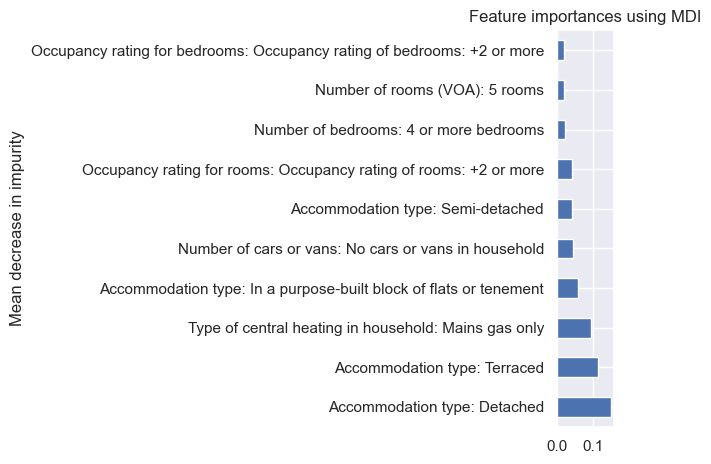

The CV Score for the training data is 0.884%, and for the test data it is 0.775%
Housing  - Accuracy: 0.893
Fitting 3 folds for each of 720 candidates, totalling 2160 fits
Best parameters found:  {'algorithm': 'auto', 'leaf_size': 10, 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}


C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\3739156422.py:42: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


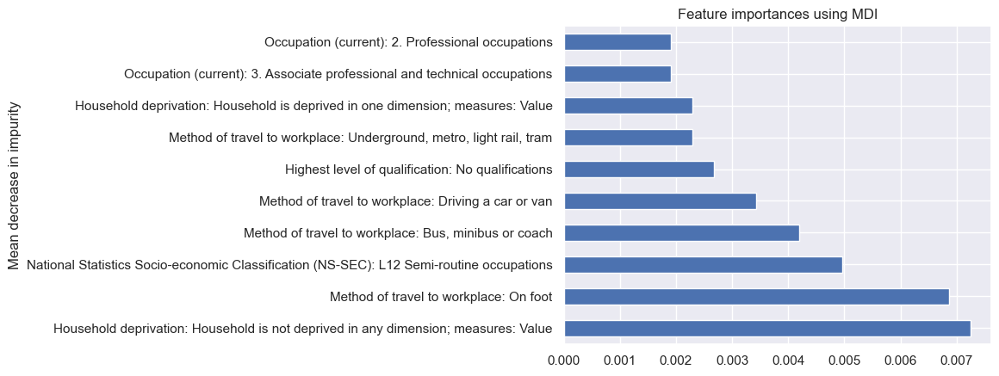

The CV Score for the training data is 0.862%, and for the test data it is 0.723%
EEO  - Accuracy: 0.866
Fitting 3 folds for each of 720 candidates, totalling 2160 fits
Best parameters found:  {'algorithm': 'auto', 'leaf_size': 10, 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}


C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\3739156422.py:42: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


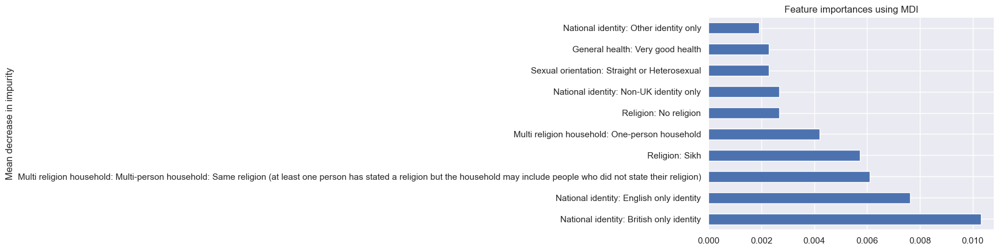

The CV Score for the training data is 0.852%, and for the test data it is 0.727%
SPIRH  - Accuracy: 0.878
Fitting 3 folds for each of 720 candidates, totalling 2160 fits
Best parameters found:  {'algorithm': 'auto', 'leaf_size': 10, 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}


C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\3739156422.py:42: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


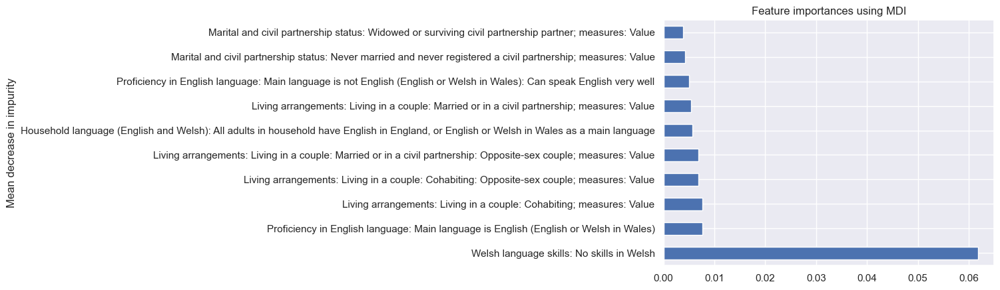

The CV Score for the training data is 0.846%, and for the test data it is 0.727%
NatPop  - Accuracy: 0.855


In [60]:
# Init the param grid and the model
param_grid = {
    'n_neighbors': [3, 5, 7, 10, 15, 20],
    'weights': ['uniform', 'distance'],
    'algorithm': ["auto", "ball_tree", "kd_tree", "brute"],
    'leaf_size': [10, 20, 30, 40, 50,],
    'p': [1, 2, 3]
}

knnc_models = []
knnc_scores = []

for idx in range(len(x2_train)):
    knnc = KNeighborsClassifier()

    # Grid search for best parameters
    grid_search = GridSearchCV(estimator=knnc, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
    grid_search.fit(x2_train[idx], y2_train[idx])
    best_params = grid_search.best_params_
    print("Best parameters found: ", best_params)

    # Generate a new model based on the best parameters
    knnc_best = KNeighborsClassifier(**best_params)
    knnc_best.fit(x2_train[idx], y2_train[idx])

    importances = permutation_importance(knnc_best, x2_test[idx], y2_test[idx])
    indices = importances.importances_mean.argsort()[::-1]

    # Assuming 'importances' and 'indices' are already defined
    top_features_indices = indices[:10]  # Adjust the number of top features as needed
    top_features = x2_train[idx].columns[top_features_indices]
    top_features_importance = importances.importances_mean[top_features_indices]

    # Create a Series for the top feature importances
    knnc_importances = pd.Series(top_features_importance, index=top_features)

    # Plot the importances with error bars
    fig, ax = plt.subplots()
    knnc_importances.plot.barh(ax=ax)
    ax.set_title("Feature importances using MDI")
    ax.set_ylabel("Mean decrease in impurity")
    fig.tight_layout()
    plt.show()

    # Assuming 'importances' and 'indices' are already defined
    top_features_indices = indices[:10]  # Adjust the number of top features as needed
    top_features = x2_train[idx].columns[top_features_indices]

    # Select the top features from the DataFrame
    x2_train_top = x2_train[idx][top_features]
    x2_test_top = x2_test[idx][top_features]

    # Train the model with top features
    knnc_top = KNeighborsClassifier(**best_params)
    knnc = knnc_top.fit(x2_train_top, y2_train[idx])

    # Cross validate the accuracy
    accuracyKNNC_train = cross_val_score(estimator=knnc, X = x2_train_top, y = y2_train[idx], cv=5)
    accuracyKNNC_test = cross_val_score(estimator=knnc, X = x2_test_top, y = y2_test[idx], cv=5)
    print("The CV Score for the training data is %.3f%%, and for the test data it is %.3f%%" %(accuracyKNNC_train.mean(), accuracyKNNC_test.mean()))

    # Calculate the predictive accuracy
    knnc_predictions = knnc.predict(x2_test_top)    
    knnc_models.append(knnc)
    score = round(accuracy_score(y2_test[idx],knnc_predictions), 3)
    knnc_scores.append(score)
    print(X_labels[idx], " - Accuracy:", score)



## 3.4 Naive-Bayes Gaussian

In [61]:
gnb_models = []
gnb_scores = []

for idx in range(len(x2_train)):
    gnb = GaussianNB()  # Initial NB

    # Search for best parameters
    grid_search = GridSearchCV(estimator=gnb, param_grid={'var_smoothing': np.logspace(0, -20, num=200)}, cv=5, n_jobs=-1, verbose=2)
    grid_search.fit(x2_train[idx], y2_train[idx])
    #grid_search.fit(x2_train_scaled, y2_train.ravel())
    best_params = grid_search.best_params_
    print("Best parameters found: ", best_params)

    # Get a new NB based on the best parameters
    gnb_best = GaussianNB(**best_params)
    gnb_best.fit(x2_train[idx], y2_train[idx])  

    """importances = permutation_importance(gnb_best, x2_test, y2_test)
    indices = importances.importances_mean.argsort()[::-1]

    # Assuming 'importances' and 'indices' are already defined
    top_features_indices = indices[:10]  # Adjust the number of top features as needed
    top_features = x2_train.columns[top_features_indices]
    top_features_importance = importances.importances_mean[top_features_indices]

    # Create a Series for the top feature importances
    gnb_importances = pd.Series(top_features_importance, index=top_features)

    # Plot the importances with error bars
    fig, ax = plt.subplots()
    gnb_importances.plot.barh(ax=ax)
    ax.set_title("Feature importances using MDI")
    ax.set_ylabel("Mean decrease in impurity")
    fig.tight_layout()
    plt.show()

    # Assuming 'importances' and 'indices' are already defined
    top_features_indices = indices[:10]  # Adjust the number of top features as needed
    top_features = x2_train.columns[top_features_indices]

    # Select the top features from the DataFrame
    x2_train_top = x2_train[top_features]
    x2_test_top = x2_test[top_features]

    # Train the model with top features
    gnb_top = GaussianNB(**best_params)
    gnb = gnb_top.fit(x2_train_top, y2_train)
    """ # Accuracy: 0.492 - With Feature Matching Above

    # Cross validate the score.
    accuracyGNB_train = cross_val_score(estimator=gnb_best, X = x2_train[idx], y = y2_train[idx], cv=5)
    accuracyGNB_test = cross_val_score(estimator=gnb_best, X = x2_test[idx], y = y2_test[idx], cv=5)
    print("The CV Score for the training data is %.3f%%, and for the test data it is %.3f%%" %(accuracyGNB_train.mean(), accuracyGNB_test.mean()))

    gnb_predictions = gnb_best.predict(x2_test[idx])

   # Calculate the predictive accuracy
    gnb_models.append(gnb_best)
    score = round(accuracy_score(y2_test[idx],gnb_predictions), 3)
    gnb_scores.append(score)
    print(X_labels[idx], " - Accuracy:", score)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


Best parameters found:  {'var_smoothing': np.float64(4.605922041145104e-08)}
The CV Score for the training data is 0.658%, and for the test data it is 0.653%
Housing  - Accuracy: 0.67
Fitting 5 folds for each of 200 candidates, totalling 1000 fits
Best parameters found:  {'var_smoothing': np.float64(3.529707302730643e-11)}
The CV Score for the training data is 0.741%, and for the test data it is 0.710%
EEO  - Accuracy: 0.75
Fitting 5 folds for each of 200 candidates, totalling 1000 fits
Best parameters found:  {'var_smoothing': np.float64(2.8005038941836253e-11)}
The CV Score for the training data is 0.621%, and for the test data it is 0.624%
SPIRH  - Accuracy: 0.628
Fitting 5 folds for each of 200 candidates, totalling 1000 fits
Best parameters found:  {'var_smoothing': np.float64(1.4314589375234756e-09)}
The CV Score for the training data is 0.544%, and for the test data it is 0.548%
NatPop  - Accuracy: 0.548


## 3.5 Support Vector Classifier (SVC)

In [62]:
# Init the param grid and the model
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto'],
    'degree': [2, 3, 4]
}

svc_models = []
svc_scores = []

for idx in range(len(x2_train)):
    svc = SVC(random_state=random_code,  probability=True)

    # Grid search for best parameters
    grid_search = GridSearchCV(estimator=svc, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
    grid_search.fit(x2_train[idx], y2_train[idx])
    best_params = grid_search.best_params_
    print("Best parameters found: ", best_params)

    # Generate a new model based on the best parameters
    svc_best = SVC(**best_params, random_state=random_code, probability=True)
    svc_best.fit(x2_train[idx], y2_train[idx])

    """importances = permutation_importance(svc_best, x2_test, y2_test)
    indices = importances.importances_mean.argsort()[::-1]

    # Assuming 'importances' and 'indices' are already defined
    top_features_indices = indices[:10]  # Adjust the number of top features as needed
    top_features = x2_train.columns[top_features_indices]
    top_features_importance = importances.importances_mean[top_features_indices]

    # Create a Series for the top feature importances
    svc_importances = pd.Series(top_features_importance, index=top_features)

    # Plot the importances with error bars
    fig, ax = plt.subplots()
    svc_importances.plot.barh(ax=ax)
    ax.set_title("Feature importances using MDI")
    ax.set_ylabel("Mean decrease in impurity")
    fig.tight_layout()
    plt.show()

    # Assuming 'importances' and 'indices' are already defined
    top_features_indices = indices[:10]  # Adjust the number of top features as needed
    top_features = x2_train.columns[top_features_indices]

    # Select the top features from the DataFrame
    x2_train_top = x2_train[top_features]
    x2_test_top = x2_test[top_features]

    # Train the model with top features
    svc_top = SVC(**best_params, random_state=random_code, probability=True)
    svc = svc_top.fit(x2_train_top, y2_train)
    """ # Accuracy: 0.609 - With Feature Matching Above

    # Cross validate the accuracy
    accuracySVC_train = cross_val_score(estimator=svc_best, X = x2_train[idx], y = y2_train[idx], cv=5)
    accuracySVC_test = cross_val_score(estimator=svc_best, X = x2_test[idx], y = y2_test[idx], cv=5)
    print("The CV Score for the training data is %.3f%%, and for the test data it is %.3f%%" %(accuracySVC_train.mean(), accuracySVC_test.mean()))

    svc_predictions = svc_best.predict(x2_test[idx])
    
    # Calculate the predictive accuracy
    svc_models.append(svc_best)
    score = round(accuracy_score(y2_test[idx],svc_predictions), 3)
    svc_scores.append(score)
    print(X_labels[idx], " - Accuracy:", score)

Fitting 3 folds for each of 36 candidates, totalling 108 fits


Best parameters found:  {'C': 10, 'degree': 2, 'gamma': 'scale', 'kernel': 'rbf'}
The CV Score for the training data is 0.728%, and for the test data it is 0.636%
Housing  - Accuracy: 0.733
Fitting 3 folds for each of 36 candidates, totalling 108 fits
Best parameters found:  {'C': 10, 'degree': 2, 'gamma': 'scale', 'kernel': 'linear'}
The CV Score for the training data is 0.674%, and for the test data it is 0.590%
EEO  - Accuracy: 0.677
Fitting 3 folds for each of 36 candidates, totalling 108 fits
Best parameters found:  {'C': 10, 'degree': 2, 'gamma': 'scale', 'kernel': 'rbf'}
The CV Score for the training data is 0.618%, and for the test data it is 0.510%
SPIRH  - Accuracy: 0.626
Fitting 3 folds for each of 36 candidates, totalling 108 fits
Best parameters found:  {'C': 10, 'degree': 2, 'gamma': 'scale', 'kernel': 'linear'}
The CV Score for the training data is 0.529%, and for the test data it is 0.439%
NatPop  - Accuracy: 0.538


## 3.6 XGBoost

In [63]:
# Init the param grid and the model
param_grid = {
    'n_estimators': [10, 50, 100, 250], 
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
}

xgb_models = []
xgb_scores = []

for idx in range(len(x2_train)):
    xgb_model = xgb.XGBClassifier(random_state=random_code, num_class= 7)

    # Grid search for best parameters
    grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
    grid_search.fit(x2_train[idx], y2_train[idx])
    best_params = grid_search.best_params_
    print("Best parameters found: ", best_params)

    xgb_best = xgb.XGBClassifier(**best_params, random_state=random_code, num_class= 7)
    xgb_best.fit(x2_train[idx], y2_train[idx])

    """importances = permutation_importance(svc_best, x2_test, y2_test)
    indices = importances.importances_mean.argsort()[::-1]

    # Assuming 'importances' and 'indices' are already defined
    top_features_indices = indices[:10]  # Adjust the number of top features as needed
    top_features = x2_train.columns[top_features_indices]
    top_features_importance = importances.importances_mean[top_features_indices]

    # Create a Series for the top feature importances
    svc_importances = pd.Series(top_features_importance, index=top_features)

    # Plot the importances with error bars
    fig, ax = plt.subplots()
    svc_importances.plot.barh(ax=ax)
    ax.set_title("Feature importances using MDI")
    ax.set_ylabel("Mean decrease in impurity")
    fig.tight_layout()
    plt.show()

    # Assuming 'importances' and 'indices' are already defined
    top_features_indices = indices[:10]  # Adjust the number of top features as needed
    top_features = x2_train.columns[top_features_indices]

    # Select the top features from the DataFrame
    x2_train_top = x2_train[top_features]
    x2_test_top = x2_test[top_features]

    # Train the model with top features
    svc_top = SVC(**best_params, random_state=random_code, probability=True)
    svc = svc_top.fit(x2_train_top, y2_train)
    """ # Accuracy: 0.609 - With Feature Matching Above

    # Cross validate the accuracy
    accuracyXGB_train = cross_val_score(estimator=xgb_best, X = x2_train[idx], y = y2_train[idx], cv=5)
    accuracyXGB_test = cross_val_score(estimator=xgb_best, X = x2_test[idx], y = y2_test[idx], cv=5)
    print("The CV Score for the training data is %.3f%%, and for the test data it is %.3f%%" %(accuracyXGB_train.mean(), accuracyXGB_test.mean()))

    xgb_predictions = xgb_best.predict(x2_test[idx])
    #xgb_predictions = np.asarray([np.argmax(line) for line in preds])

    # Calculate the predictive accuracy
    xgb_models.append(xgb_best)
    score = round(accuracy_score(y2_test[idx],xgb_predictions), 3)
    xgb_scores.append(score)
    print(X_labels[idx], " - Accuracy:", score)

Fitting 3 folds for each of 36 candidates, totalling 108 fits
Best parameters found:  {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 250}
The CV Score for the training data is 0.921%, and for the test data it is 0.765%
Housing  - Accuracy: 0.92
Fitting 3 folds for each of 36 candidates, totalling 108 fits
Best parameters found:  {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 250}
The CV Score for the training data is 0.929%, and for the test data it is 0.813%
EEO  - Accuracy: 0.941
Fitting 3 folds for each of 36 candidates, totalling 108 fits
Best parameters found:  {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 250}
The CV Score for the training data is 0.916%, and for the test data it is 0.769%
SPIRH  - Accuracy: 0.926
Fitting 3 folds for each of 36 candidates, totalling 108 fits
Best parameters found:  {'learning_rate': 0.05, 'max_depth': 7, 'n_estimators': 250}
The CV Score for the training data is 0.904%, and for the test data it is 0.773%
NatPop  - Accurac

# 4.0 Ensemble Models
Let's vote and see what happens.

## 4.1 Fit the Model

In [64]:
#ensemble_model = VotingClassifier(estimators=[('rfr', rfr), ('knnr', knnr_best)], voting='soft')

In [65]:
voting_weights = rfc_scores + tree_scores + knnc_scores + gnb_scores + svc_scores + xgb_scores

voting_weights_h = voting_weights[0::4]
voting_weights_e = voting_weights[1::4]
voting_weights_s = voting_weights[2::4]
voting_weights_n =voting_weights[3::4]

norm_voting_weights_h = [float(i)/max(voting_weights_h) for i in voting_weights_h]
norm_voting_weights_e = [float(i)/max(voting_weights_e) for i in voting_weights_e]
norm_voting_weights_s = [float(i)/max(voting_weights_s) for i in voting_weights_s]
norm_voting_weights_n = [float(i)/max(voting_weights_n) for i in voting_weights_n]

In [66]:
ensemble_model_h = VotingClassifier(estimators=[('rfc_h', rfc_models[0]),('tree_h', tree_models[0]), ('knnc_h', knnc_models[0]), ('gnb_h', gnb_models[0]), ('svc_h', svc_models[0]), ('xgb_h', xgb_models[0])],
                                  voting='soft', weights=norm_voting_weights_h)

ensemble_model_e = VotingClassifier(estimators=[('rfc_e', rfc_models[1]), ('tree_e', tree_models[1]), ('knnc_e', knnc_models[1]), ('gnb_e', gnb_models[1]), ('svc_e', svc_models[1]), ('xgb_e', xgb_models[1])],
                                  voting='soft', weights=norm_voting_weights_e)

ensemble_model_s = VotingClassifier(estimators=[('rfc_s', rfc_models[2]), ('tree_s', tree_models[2]), ('knnc_s', knnc_models[2]), ('gnb_s', gnb_models[2]), ('svc_s', svc_models[2]), ('xgb_s', xgb_models[2])],
                                  voting='soft', weights=norm_voting_weights_s)

ensemble_model_n = VotingClassifier(estimators=[('rfc_n', rfc_models[3]), ('tree_n', tree_models[3]), ('knnc_n', knnc_models[3]), ('gnb_n', gnb_models[3]), ('svc_n', svc_models[3]), ('xgb_n', xgb_models[3])],
                                  voting='soft', weights=norm_voting_weights_n)

ensemble_model_h.fit(x2_train1, y2_train1)
ensemble_predictions_h = ensemble_model_h.predict(x2_test1)
print("Housing - Ensemble model score: ", ensemble_model_h.score(x2_test1, y2_test1))
print("Accuracy:", round(accuracy_score(y2_test1,ensemble_predictions_h), 3), "\n")

ensemble_model_e.fit(x2_train2, y2_train2)
ensemble_predictions_e = ensemble_model_e.predict(x2_test2)
print("EEO - Ensemble model score: ", ensemble_model_e.score(x2_test2, y2_test2))
print("Accuracy:", round(accuracy_score(y2_test2,ensemble_predictions_e), 3), "\n")

ensemble_model_s.fit(x2_train3, y2_train3)
ensemble_predictions_s = ensemble_model_s.predict(x2_test3)
print("SPIRH - Ensemble model score: ", ensemble_model_s.score(x2_test3, y2_test3))
print("Accuracy:", round(accuracy_score(y2_test3,ensemble_predictions_s), 3), "\n")

ensemble_model_n.fit(x2_train4, y2_train4)
ensemble_predictions_n = ensemble_model_n.predict(x2_test4)
print("NatPop - Ensemble model score: ", ensemble_model_n.score(x2_test4, y2_test4))
print("Accuracy:", round(accuracy_score(y2_test4,ensemble_predictions_n), 3), "\n")

Housing - Ensemble model score:  0.9026717557251909
Accuracy: 0.903 

EEO - Ensemble model score:  0.9293893129770993
Accuracy: 0.929 

SPIRH - Ensemble model score:  0.9179389312977099
Accuracy: 0.918 

NatPop - Ensemble model score:  0.9007633587786259
Accuracy: 0.901 



In [67]:
mapped_ensemble_predictions_h = pd.Series(ensemble_predictions_h).map(num_to_party_map)
mapped_ensemble_predictions_e = pd.Series(ensemble_predictions_e).map(num_to_party_map)
mapped_ensemble_predictions_s = pd.Series(ensemble_predictions_s).map(num_to_party_map)
mapped_ensemble_predictions_n = pd.Series(ensemble_predictions_n).map(num_to_party_map)
mapped_y2_test = pd.Series(y2_test1).map(num_to_party_map)

# Build combined data frame (with correct indexes)
d = {'PCON25CD': Y_index, "PCON25NM": Y_index_names}
geography = pd.DataFrame(d)

d = {'Raw Truth': y2_test1, "Truth": mapped_y2_test}
result = pd.DataFrame(d)

d = {'Housing - Prediction': mapped_ensemble_predictions_h, 'EEO - Prediction': mapped_ensemble_predictions_e, 'SPIRH - Prediction': mapped_ensemble_predictions_s, 'NatPop - Prediction':mapped_ensemble_predictions_n}
new_result = pd.DataFrame(d).set_index(result.index)

comb_result = result.merge(new_result,how='inner', left_index=True, right_index=True)
comb_result = geography.merge(comb_result,how='inner', left_index=True, right_index=True)

# Hard Voting system to get the most frequent result from all 4
consolidated_prediction = []
for index, row in comb_result.drop(columns=["Raw Truth", "Truth","PCON25NM","PCON25CD"],axis=1).iterrows():
    unique_vals = row.unique()
    if len(row.unique()) > 1:
        consolidated_prediction.append(row.mode()[0])
    else:
        consolidated_prediction.append(row[0])
        
comb_result['Consolidated Prediction'] = consolidated_prediction

# Print Results
matching_rows = comb_result[comb_result['Truth'] != comb_result['Consolidated Prediction']]
final_score = 1 - len(matching_rows)/len(comb_result)
print("Consolidated Score: ", 100* final_score, "%")

matching_rows = comb_result[comb_result['Truth'] != comb_result['EEO - Prediction']]
final_score = 1 - len(matching_rows)/len(comb_result)
print("EEO Score: ", 100* final_score, "%")

matching_rows = comb_result[comb_result['Truth'] != comb_result['SPIRH - Prediction']]
final_score = 1 - len(matching_rows)/len(comb_result)
print("SPIRH Score: ", 100* final_score, "%")

matching_rows = comb_result[comb_result['Truth'] != comb_result['NatPop - Prediction']]
final_score = 1 - len(matching_rows)/len(comb_result)
print("NatPop Score: ", 100* final_score, "%")

matching_rows = comb_result[comb_result['Truth'] != comb_result['Housing - Prediction']]
final_score = 1 - len(matching_rows)/len(comb_result)
print("Housing Score: ", 100* final_score, "%")

Consolidated Score:  72.46376811594203 %
EEO Score:  74.63768115942028 %
SPIRH Score:  70.28985507246377 %
NatPop Score:  63.76811594202898 %
Housing Score:  64.4927536231884 %


C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\1500970490.py:27: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  consolidated_prediction.append(row[0])


So bad news. SMOTE has actually not preserved my data. Inspecting it (after noticing Ynys Mon went conservative as its Truth, when it should have been Plaid) it has chnaged the Truth data.

So the plus side, after removing the Simulated Data, the actual consolidated performance is 70%. But this is after the data has been modified. 

## 4.2 Read the actual data

In [68]:
_, x2_test1, _, y2_test1 = train_test_split(X1, Y2, test_size=0.2, random_state=random_code)
_, x2_test2, _, y2_test2 = train_test_split(X2, Y2, test_size=0.2, random_state=random_code)
_, x2_test3, _, y2_test3 = train_test_split(X3, Y2, test_size=0.2, random_state=random_code)
_, x2_test4, _, y2_test4 = train_test_split(X4, Y2, test_size=0.2, random_state=random_code)

In [69]:
ensemble_predictions_h = ensemble_model_h.predict(x2_test1)
ensemble_predictions_e = ensemble_model_e.predict(x2_test2)
ensemble_predictions_s = ensemble_model_s.predict(x2_test3)
ensemble_predictions_n = ensemble_model_n.predict(x2_test4)

mapped_ensemble_predictions_h = pd.Series(ensemble_predictions_h).map(num_to_party_map)
mapped_ensemble_predictions_e = pd.Series(ensemble_predictions_e).map(num_to_party_map)
mapped_ensemble_predictions_s = pd.Series(ensemble_predictions_s).map(num_to_party_map)
mapped_ensemble_predictions_n = pd.Series(ensemble_predictions_n).map(num_to_party_map)
mapped_y2_test = pd.Series(y2_test1).map(num_to_party_map)

# Build combined data frame (with correct indexes)
d = {'PCON25CD': Y_index, "PCON25NM": Y_index_names}
geography = pd.DataFrame(d)

d = {'Raw Truth': y2_test1, "Truth": mapped_y2_test}
result = pd.DataFrame(d)

d = {'Housing - Raw Prediction': ensemble_predictions_h, 'Housing - Prediction': mapped_ensemble_predictions_h, 
     'EEO - Raw Prediction': ensemble_predictions_e, 'EEO - Prediction': mapped_ensemble_predictions_e, 
     'SPIRH - Raw Prediction': ensemble_predictions_s, 'SPIRH - Prediction': mapped_ensemble_predictions_s, 
     'NatPop - Raw Prediction':ensemble_predictions_n, 'NatPop - Prediction':mapped_ensemble_predictions_n}
new_result = pd.DataFrame(d).set_index(result.index)

comb_result = result.merge(new_result,how='inner', left_index=True, right_index=True)
comb_result = geography.merge(comb_result,how='inner', left_index=True, right_index=True)

# Hard Voting system to get the most frequent result from all 4
consolidated_prediction = []
for index, row in comb_result.drop(columns=["Raw Truth", "Truth", "EEO - Raw Prediction", "NatPop - Raw Prediction", "SPIRH - Raw Prediction", "Housing - Raw Prediction", "PCON25NM","PCON25CD"],axis=1).iterrows():
    unique_vals = row.unique()
    if len(row.unique()) > 1:
        consolidated_prediction.append(row.mode()[0])
    else:
        consolidated_prediction.append(row[0])
        
comb_result['Consolidated Prediction'] = consolidated_prediction
comb_result["Consolidated Raw Prediction"] = comb_result['Consolidated Prediction'].map(party_to_num_map)

# Print Results
matching_rows = comb_result[comb_result['Truth'] != comb_result['Consolidated Prediction']]
consolidated_final_score = 1 - len(matching_rows)/len(comb_result)
print("Consolidated Score: ", 100* consolidated_final_score, "%")

matching_rows = comb_result[comb_result['Truth'] != comb_result['EEO - Prediction']]
eeo_final_score = 1 - len(matching_rows)/len(comb_result)
print("EEO Score: ", 100* eeo_final_score, "%")

matching_rows = comb_result[comb_result['Truth'] != comb_result['SPIRH - Prediction']]
spirh_final_score = 1 - len(matching_rows)/len(comb_result)
print("SPIRH Score: ", 100* spirh_final_score, "%")

matching_rows = comb_result[comb_result['Truth'] != comb_result['NatPop - Prediction']]
natpop_final_score = 1 - len(matching_rows)/len(comb_result)
print("NatPop Score: ", 100* natpop_final_score, "%")

matching_rows = comb_result[comb_result['Truth'] != comb_result['Housing - Prediction']]
housing_final_score = 1 - len(matching_rows)/len(comb_result)
print("Housing Score: ", 100* housing_final_score, "%")

comb_result.to_csv(os.path.join('CensusElection_PredictorV3.csv'), index=False)

Consolidated Score:  89.56521739130436 %
EEO Score:  91.30434782608697 %
SPIRH Score:  87.82608695652175 %
NatPop Score:  90.43478260869566 %
Housing Score:  88.69565217391305 %


C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\1411618141.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  consolidated_prediction.append(row[0])


In [70]:
comb_result

,PCON25CD,PCON25NM,Raw Truth,Truth,Housing - Raw Prediction,Housing - Prediction,EEO - Raw Prediction,EEO - Prediction,SPIRH - Raw Prediction,SPIRH - Prediction,NatPop - Raw Prediction,NatPop - Prediction,Consolidated Prediction,Consolidated Raw Prediction
6,E14001064,Aldridge-Brownhills,1,Con,1,Con,1,Con,1,Con,1,Con,Con,1
14,E14001067,Arundel and South Downs,1,Con,1,Con,1,Con,1,Con,1,Con,Con,1
17,E14001070,Ashton-under-Lyne,0,Lab,0,Lab,0,Lab,0,Lab,0,Lab,Lab,0
18,E14001071,Aylesbury,0,Lab,0,Lab,0,Lab,0,Lab,0,Lab,Lab,0
20,E14001072,Banbury,0,Lab,0,Lab,0,Lab,0,Lab,0,Lab,Lab,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631,E14001589,Wirral West,0,Lab,0,Lab,0,Lab,0,Lab,0,Lab,Lab,0
636,E14001594,Wolverhampton North East,0,Lab,0,Lab,0,Lab,0,Lab,0,Lab,Lab,0
638,E14001596,Wolverhampton West,0,Lab,0,Lab,0,Lab,0,Lab,0,Lab,Lab,0
645,E14001602,Wythenshawe and Sale East,0,Lab,0,Lab,0,Lab,0,Lab,0,Lab,Lab,0


# 4.3 Statistical Significance

In [71]:
P_list = []
R_list = []
F1_list = []

predictors = ['Housing - Prediction', 'NatPop - Prediction', 'SPIRH - Prediction', 'EEO - Prediction', 'Consolidated Prediction']

for label in labels:
    # Generate the Confusion Matrix
    Actual_P = comb_result[comb_result["Truth"] == label]
    Actual_N = comb_result[comb_result["Truth"] != label]

    for predictor in predictors:
        TP = len(Actual_P[comb_result[predictor] == label])
        FN = len(Actual_P[comb_result[predictor] != label])
        FP = len(Actual_N[comb_result[predictor] == label])
        TN = len(Actual_N[comb_result[predictor] != label])

        P = TP/(TP+FP) # Precision
        P_list.append(P)
        R = TP/(TP+FN) # Recall
        R_list.append(R)
        F1 = 2 * P * R / (P + R) # F1 Score
        F1_list.append(F1)
        
        print("\nFor :", label, "-", predictor)
        print("Precision: %.2f" %P)
        print("Recall: %.2f" %R)
        print("F1 Score: %.2f" %R)


For : Lab - Housing - Prediction
Precision: 0.95
Recall: 0.87
F1 Score: 0.87

For : Lab - NatPop - Prediction
Precision: 0.98
Recall: 0.86
F1 Score: 0.86

For : Lab - SPIRH - Prediction
Precision: 0.98
Recall: 0.84
F1 Score: 0.84

For : Lab - EEO - Prediction
Precision: 1.00
Recall: 0.89
F1 Score: 0.89

For : Lab - Consolidated Prediction
Precision: 1.00
Recall: 0.84
F1 Score: 0.84

For : Con - Housing - Prediction
Precision: 0.82
Recall: 0.92
F1 Score: 0.92

For : Con - NatPop - Prediction
Precision: 0.89
Recall: 0.96
F1 Score: 0.96

For : Con - SPIRH - Prediction
Precision: 0.82
Recall: 0.92
F1 Score: 0.92

For : Con - EEO - Prediction
Precision: 0.85
Recall: 0.92
F1 Score: 0.92

For : Con - Consolidated Prediction
Precision: 0.83
Recall: 0.96
F1 Score: 0.96

For : LD - Housing - Prediction
Precision: 0.81
Recall: 0.87
F1 Score: 0.87

For : LD - NatPop - Prediction
Precision: 0.75
Recall: 1.00
F1 Score: 1.00

For : LD - SPIRH - Prediction
Precision: 0.67
Recall: 0.93
F1 Score: 0.93


C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\2230307737.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  TP = len(Actual_P[comb_result[predictor] == label])
C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\2230307737.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  FN = len(Actual_P[comb_result[predictor] != label])
C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\2230307737.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  FP = len(Actual_N[comb_result[predictor] == label])
C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\2230307737.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  TN = len(Actual_N[comb_result[predictor] != label])
C:\Users\roryj\AppData\Local\Temp\ipykernel_28024\2230307737.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  TP = len(Actual_P[comb_result[predictor] == label])
C:\Users\r

In [72]:
print("Average Precision: %.2f" %np.average(P_list))
print("Average Recall: %.2f" %np.average(R_list))
print("Average F1: %.2f" %np.average(F1_list))

Average Precision: 0.84
Average Recall: 0.97
Average F1: 0.89


Cool! Our recall and our precision are quite high. And our overall F1 is really high so it is quite a reassuring value for the performance of the calculator. 

In [73]:
trial = [svc_predictions, gnb_predictions, xgb_predictions, knnc_predictions, rfc_predictions, tree_prediction]
for idx, val_i in enumerate(trial):
    for jdx, val_j in enumerate(trial):
        stats, p  = f_oneway(val_i, val_j)
        if p <=0.05:
            print("i", idx, "j", jdx, stats, p)

i 0 j 1 17.485332582211903 3.137711191361321e-05
i 0 j 2 11.903369265142018 0.0005826840550708696
i 0 j 3 4.128179606171825 0.04242704201122766
i 0 j 4 11.522354799424154 0.0007134477600909433
i 0 j 5 9.418230959138567 0.0022037244981602463
i 1 j 0 17.485332582211903 3.137711191361321e-05
i 1 j 2 66.3259281424352 1.0807905811181538e-15
i 1 j 3 46.041949639172486 1.934489094047226e-11
i 1 j 4 65.9855230094138 1.271399621345645e-15
i 1 j 5 60.79652650344041 1.5237864268344693e-14
i 2 j 0 11.903369265142018 0.0005826840550708696
i 2 j 1 66.3259281424352 1.0807905811181538e-15
i 3 j 0 4.128179606171824 0.04242704201122766
i 3 j 1 46.04194963917248 1.934489094047226e-11
i 4 j 0 11.522354799424154 0.0007134477600909433
i 4 j 1 65.9855230094138 1.271399621345645e-15
i 5 j 0 9.418230959138565 0.0022037244981602463
i 5 j 1 60.79652650344041 1.5237864268344693e-14


My interpretation of this, is that despite all potential combinations of the 6 ML algorithms applied (SVC, GNB, XGB, KNNC, RFC and Tree), there are only 8 combinations of models which are distinct enough from each other in their performance.

These are:
- SVC-GNB
- SVC-XGB
- SVC-RFC
- SVC-Tree
- GNB-XGB
- GNB-KNNC
- GNB-RFC
- GNB-Tree

This however, when paired with the scores from the fitting shows that actually, GNB and SVC are distinct enough because of their poor performance and not because of their ability to match the data.

In [74]:
stats, p  = f_oneway(comb_result['Housing - Raw Prediction'], comb_result['EEO - Raw Prediction'], comb_result['SPIRH - Raw Prediction'], comb_result['NatPop - Raw Prediction'])
print("All Ensemble Models ",stats, p)
stats, p = f_oneway(comb_result['Consolidated Raw Prediction'], comb_result['Raw Truth'])
print("Truth - Consolidated", stats, p)
stats, p  = f_oneway(comb_result['Raw Truth'], comb_result['SPIRH - Raw Prediction'])
print("Truth - SPIRH",stats, p)
stats, p  = f_oneway(comb_result['Raw Truth'], comb_result['EEO - Raw Prediction'])
print("Truth - EEO",stats, p)
stats, p  = f_oneway(comb_result['Raw Truth'], comb_result['NatPop - Raw Prediction'])
print("Truth - NatPop",stats, p)
stats, p  = f_oneway(comb_result['Raw Truth'], comb_result['Housing - Raw Prediction'])
print("Truth - Housing",stats, p)

All Ensemble Models  0.10513402761464768 0.957060975671334
Truth - Consolidated 1.59284064665127 0.2082102424238667
Truth - SPIRH 1.4479004665629858 0.23011306205733634
Truth - EEO 0.8897018474483261 0.3465565226969455
Truth - NatPop 1.6465352481843498 0.2007339143987965
Truth - Housing 0.6424381828637146 0.4236638065181756


My interpretation of this is that:
1. all the ensemble models are not distinct from each other, showing they all seem to guess the same thing with a high degree of similarity.
2. the consolidated prediction is not statistically distinct enough from the 'Truth'. Which is good (I think) as it shows that the prediction is somewhat decent if they aren't significantly distinct from the truth.
3. the individual ensemble models are also not statistically distinct enough from the 'Truth' which is also good but it does highlight some better performing models. Where it seems to suggest the best models, in descending are: [Housing, EEO, Consolidated, NatPop and SPIRH]

In [75]:
# Assuming 'Consolidated Prediction' contains the predicted probabilities
# and 'Truth' contains the actual class labels

# Create a DataFrame with the necessary columns
data = pd.DataFrame({
    'Truth': comb_result['Raw Truth'],
    'Consolidated': comb_result['Consolidated Raw Prediction'],
    'Housing': comb_result['Housing - Raw Prediction'],
    'EEO': comb_result['EEO - Raw Prediction'],
    'SPIRH': comb_result['SPIRH - Raw Prediction'],
    'NatPop': comb_result['NatPop - Raw Prediction'],
})
#predictors = ['Housing - Prediction', 'NatPop - Prediction', 'SPIRH - Prediction', 'EEO - Prediction', 'Consolidated Prediction']

# Fit the ANOVA model
model = ols('Consolidated ~ C(Truth)', data=data).fit()
anova_results = anova_lm(model)
print("Consolidated", anova_results)

# Fit the ANOVA model
model = ols('Housing ~ C(Truth)', data=data).fit()
anova_results = anova_lm(model)
print("Housing", anova_results)

# Fit the ANOVA model
model = ols('EEO ~ C(Truth)', data=data).fit()
anova_results = anova_lm(model)
print("EEO", anova_results)

# Fit the ANOVA model
model = ols('SPIRH ~ C(Truth)', data=data).fit()
anova_results = anova_lm(model)
print("SPIRH", anova_results)

# Fit the ANOVA model
model = ols('NatPop ~ C(Truth)', data=data).fit()
anova_results = anova_lm(model)
print("NatPop", anova_results)

Consolidated              df      sum_sq    mean_sq          F        PR(>F)
C(Truth)    6.0  110.113913  18.352319  35.609961  1.760404e-23
Residual  108.0   55.660000   0.515370        NaN           NaN
Housing              df      sum_sq    mean_sq          F        PR(>F)
C(Truth)    6.0  104.686542  17.447757  30.244201  4.677243e-21
Residual  108.0   62.304762   0.576896        NaN           NaN
EEO              df      sum_sq    mean_sq          F        PR(>F)
C(Truth)    6.0  122.488447  20.414741  80.753162  1.245140e-37
Residual  108.0   27.302857   0.252804        NaN           NaN
SPIRH              df      sum_sq    mean_sq          F        PR(>F)
C(Truth)    6.0  106.213623  17.702271  31.719587  9.512838e-22
Residual  108.0   60.273333   0.558086        NaN           NaN
NatPop              df      sum_sq    mean_sq          F        PR(>F)
C(Truth)    6.0  106.312050  17.718675  24.939154  2.175700e-18
Residual  108.0   76.731429   0.710476        NaN           NaN


I think I should improve my understanding of ANOVA. Maybe a new project is the best place to play with this.

## 4.4 Conformal Predictions

In [ ]:
ensemble_predictions_probability_h = ensemble_model_h.predict_proba(x2_test1)

"""ensemble_predictions_h = ensemble_model_h.predict(x2_test1)
print("Housing - Ensemble model score: ", ensemble_model_h.score(x2_test1, y2_test1))
print("Accuracy:", round(accuracy_score(y2_test1,ensemble_predictions_h), 3), "\n")"""
